In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import arviz as az
import pymc as pm
import corner
import scipy.stats as st
from statistics import mean, stdev
from collections import Counter
from math import floor,ceil

In [2]:
file_path = 'Datasets/mt_genes_metadata.csv'

met = pd.read_csv(file_path)

pro_code=met[met['gene_type']=='protein_coding']
intpro=pro_code['gene_name'].tolist()
intpro=['MT-ND1','MT-ND2','MT-ND3','MT-ND4','MT-ND4L','MT-ND5','MT-ND6', 'MT-CO1', 'MT-CO2','MT-CO3', 'MT-ATP6', 'MT-ATP8', 'MT-CYB']
intpronon=intpro+['non-MT']


In [3]:
file_path = 'Datasets/Donor1_CD4_Genes.csv'

p14 = pd.read_csv(file_path)

p14.drop(columns=p14.columns[0], axis=1, inplace=True)

p14_int=pd.DataFrame([p14[i] for i in intpro]).T

file_path = 'Datasets/Donor1_CD8_Genes.csv'

p18 = pd.read_csv(file_path)

p18.drop(columns=p18.columns[0], axis=1, inplace=True)

p18_int=pd.DataFrame([p18[i] for i in intpro]).T

file_path = 'Datasets/Donor2_CD4_Genes.csv'

p24 = pd.read_csv(file_path)

p24.drop(columns=p24.columns[0], axis=1, inplace=True)

p24_int=pd.DataFrame([p24[i] for i in intpro]).T

file_path = 'Datasets/Donor2_CD8_Genes.csv'

p28 = pd.read_csv(file_path)

p28.drop(columns=p28.columns[0], axis=1, inplace=True)

p28_int=pd.DataFrame([p28[i] for i in intpro]).T

In [4]:
p14n=len(p14_int)
p18n=len(p18_int)
p24n=len(p24_int)
p28n=len(p28_int)

In [5]:
p14=p14.drop(p14[p14_int.sum(axis=1)==0].index)
p14.index=range(len(p14))
p18=p18.drop(p18[p18_int.sum(axis=1)==0].index)
p18.index=range(len(p18))
p24=p24.drop(p24[p24_int.sum(axis=1)==0].index)
p24.index=range(len(p24))
p28=p28.drop(p28[p28_int.sum(axis=1)==0].index)
p28.index=range(len(p28))


In [6]:
p14_intnon=pd.DataFrame([p14[i] for i in intpronon]).T
p14_int=pd.DataFrame([p14[i] for i in intpro]).T
p18_intnon=pd.DataFrame([p18[i] for i in intpronon]).T
p18_int=pd.DataFrame([p18[i] for i in intpro]).T

p24_intnon=pd.DataFrame([p24[i] for i in intpronon]).T
p24_int=pd.DataFrame([p24[i] for i in intpro]).T
p28_intnon=pd.DataFrame([p28[i] for i in intpronon]).T
p28_int=pd.DataFrame([p28[i] for i in intpro]).T

In [7]:
p14_ruiz_n1=p14_int.copy(deep=True) #for ruiz normalisation

In [8]:
p14_intsampto=p14_int.sum(axis=1)
p18_intsampto=p18_int.sum(axis=1)
p24_intsampto=p24_int.sum(axis=1)
p28_intsampto=p28_int.sum(axis=1)

#Calculates the number of genes for each DNA
p14_allsampto=p14.sum(axis=1)
p18_allsampto=p18.sum(axis=1)
p24_allsampto=p24.sum(axis=1)
p28_allsampto=p28.sum(axis=1)

p14_intnon_sampto=p14_intnon.sum(axis=1)
p18_intnon_sampto=p18_intnon.sum(axis=1)
p24_intnon_sampto=p24_intnon.sum(axis=1)
p28_intnon_sampto=p28_intnon.sum(axis=1)

In [9]:
p14_n1=p14_int.copy(deep=True)
p18_n1=p18_int.copy(deep=True)
p24_n1=p24_int.copy(deep=True)
p28_n1=p28_int.copy(deep=True)

p14_n2=p14_int.copy(deep=True)
p18_n2=p18_int.copy(deep=True)
p24_n2=p24_int.copy(deep=True)
p28_n2=p28_int.copy(deep=True)

p14_n3=p14.copy(deep=True)
p18_n3=p18_int.copy(deep=True)
p24_n3=p24_int.copy(deep=True)
p28_n3=p28_int.copy(deep=True)

Ruiz's normalisation

In [ ]:
r=1000/(np.e ** 1.9340102220340734)
p14_int_ruiz_len=len(p14_ruiz_n1)
for j in intpro:
    for i in p14_ruiz_n1.index: 
            norm_cons=(p14_intsampto[i])/r #inidividual normalisation constant
            p14_ruiz_n1.loc[i,j]=p14_ruiz_n1[j][i]/norm_cons

In [ ]:
uem14_ruiz_n1_list=[]
for i in intpro:
    uem14_ruiz_n1_list.append(mean(p14_ruiz_n1[i]))
uem14_ruiz_n1_list=dict(zip(intpro,uem14_ruiz_n1_list))
uem14_ruiz_n1_list

In [ ]:
p14_ruiz_n1

Chi square for ruiz

In [ ]:
import scipy.stats as st
from math import floor, ceil
#df=dataframe, index_list=list of names of the 13 genes, lam = dictionary of parameter for the poisson with keys corresponding to index_list 
def expected_count_poi(df, index_list, lam):
    expected_vals=[] #frequency
    expected_ranges=[] #corresponding ranges
    n=len(df)
    for j in index_list:
        li=[]
        ind=[]
        lamb=lam[j]
        m=floor(min(df[j]))
        M=ceil(max(df[j]))
        low=m
        upp=m+1
        if m==0:
            coun=n*st.poisson.cdf(m+1,lamb) 
        else: 
            coun=n*(st.poisson.cdf(m+1,lamb)-st.poisson.cdf(m-1,lamb))
        if coun>=5:
            ind.append([low,upp])
            li.append(coun)
            low=upp
            upp+=1
            coun=0
        else:
            pass
        for i in range(m+1,M-1,1):
            coun+=n*(st.poisson.cdf(i+1,lamb)-st.poisson.cdf(i,lamb))
            if coun>=5: 
                upp=i+1
                ind.append([low,upp])
                li.append(coun)
                coun=0
                low=upp
            else:
                pass
        upp=M
        coun+=n*(st.poisson.cdf(M,lamb)-st.poisson.cdf(M-1,lamb))
        if coun>=5:
            ind.append([low,upp])
            li.append(coun)
        else:
            li[-1]=li[-1]+coun
            ind[-1][1]=upp
        expected_vals.append(li)
        expected_ranges.append(ind)
    expected_vals=dict(zip(index_list,expected_vals))
    expected_ranges=dict(zip(index_list,expected_ranges))
    return (expected_vals,expected_ranges)

def ex_vals_poi(df, index_list, lam):
    return expected_count_poi(df, index_list, lam)[0]

def ex_range_poi(df, index_list, lam):
    return expected_count_poi(df, index_list, lam)[1]

def obs_count_poi(df,index_list, lam):
    comp_ran=ex_range_poi(df,index_list, lam)
    obs_val=[]
    for j in index_list:
        li=[]
        ran=comp_ran[j]
        df_j=df[j]
        l,h=ran[0][0],ran[0][1]
        li.append(len(df_j[(df_j>=l) & (df_j<=h)]))
        for i in range(1,len(ran),1):
            l,h=ran[i][0],ran[i][1]
            li.append(len(df_j[(df_j>l) & (df_j<=h)]))
        obs_val.append(li)
    return dict(zip(index_list,obs_val))
    
def chi2_res_poi(df,index_list, lam, alp=0.99):
    ex=ex_vals_poi(df, index_list, lam)
    obs=obs_count_poi(df,index_list, lam)
    import scipy.stats as st
    res=[]
    for j in index_list:
        deg=len(ex)-1
        cv=st.chi2.ppf(alp,deg)
        ele=[(a-b)**2/a for a,b in zip(ex[j],obs[j])]
        ts=sum(ele)
        res.append(ts-cv)
    return res



In [ ]:
chi2_res_poi(p14_ruiz_n1,intpro,uem14_ruiz_n1_list)

Back to my normalisations

In [10]:
#normalising of 13+non
r=1000
p14_int_non_len=len(p14_intnon)
for j in intpro:
    for i in p14_intnon.index: 
            norm_cons=(p14_intnon_sampto[i]-p14_intnon.loc[i,j])/r #inidividual normalisation constant
            p14_intnon.loc[i,j]=p14_intnon.loc[i,j]/norm_cons

#normalising of 13+non
r=1000
p18_int_non_len=len(p18_intnon)
for j in intpro:
    for i in p18_intnon.index: 
            norm_cons=(p18_intnon_sampto[i]-p18_intnon.loc[i,j])/r #inidividual normalisation constant
            p18_intnon.loc[i,j]=p18_intnon.loc[i,j]/norm_cons

#normalising of 13+non
r=1000
p24_int_non_len=len(p24_intnon)
for j in intpro:
    for i in p24_intnon.index: 
            norm_cons=(p24_intnon_sampto[i]-p24_intnon.loc[i,j])/r #inidividual normalisation constant
            p24_intnon.loc[i,j]=p24_intnon.loc[i,j]/norm_cons

#normalising of 13+non
r=1000
p28_int_non_len=len(p28_intnon)
for j in intpro:
    for i in p28_intnon.index: 
            norm_cons=(p28_intnon_sampto[i]-p28_intnon.loc[i,j])/r #inidividual normalisation constant
            p28_intnon.loc[i,j]=p28_intnon.loc[i,j]/norm_cons


C:\Users\lizar\AppData\Local\Temp\ipykernel_27328\1517379013.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '8.168822328114363' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  p14_intnon.loc[i,j]=p14_intnon.loc[i,j]/norm_cons
C:\Users\lizar\AppData\Local\Temp\ipykernel_27328\1517379013.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2.029769959404601' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  p14_intnon.loc[i,j]=p14_intnon.loc[i,j]/norm_cons
C:\Users\lizar\AppData\Local\Temp\ipykernel_27328\1517379013.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '4.067796610169491' has dtype incompatible with int64, please explicitly cast to a compatible dty

Calculating UEM of proportion parameter at r=100 and r=1000

In [11]:
def uem_nbi(df,index_list,r):
    uem14_non_list=[]
    uem14_non_samp=[]
    for j in index_list:
        uem_sample_list=[]
        for i in range(len(df)):   
            x=df[j][i]
            uem=(r-1)/(x+r-1)
            uem_sample_list.append(uem)
        uem14_non_samp.append(uem_sample_list)
        uem14_non_list.append(mean(uem_sample_list))
        #the following plots the distribution of the UEM 
    uem14_non_list=dict(zip(index_list,uem14_non_list))
    uem14_non_samp=dict(zip(index_list,uem14_non_samp))
    return uem14_non_list,uem14_non_samp

In [12]:
uem14_non_list_n3=uem_nbi(p14_intnon,intpro,1000)[0]
uem14_non_samp_n3=uem_nbi(p14_intnon,intpro,1000)[1]

uem18_non_list_n3=uem_nbi(p18_intnon,intpro,1000)[0]
uem18_non_samp_n3=uem_nbi(p18_intnon,intpro,1000)[1]

uem24_non_list_n3=uem_nbi(p24_intnon,intpro,1000)[0]
uem24_non_samp_n3=uem_nbi(p24_intnon,intpro,1000)[1]

uem28_non_list_n3=uem_nbi(p28_intnon,intpro,1000)[0]
uem28_non_samp_n3=uem_nbi(p28_intnon,intpro,1000)[1]

In [37]:
uem28_non_list_n3

{'MT-ND1': 0.9972647239075604,
 'MT-ND2': 0.9987646209376552,
 'MT-ND3': 0.9973842682662792,
 'MT-ND4': 0.9986134158930514,
 'MT-ND4L': 0.9967598018576711,
 'MT-ND5': 0.9980447810563908,
 'MT-ND6': 0.9994029685891107,
 'MT-CO1': 0.9939241342225339,
 'MT-CO2': 0.9927116823247477,
 'MT-CO3': 0.9945994962941753,
 'MT-ATP6': 0.9991526492800914,
 'MT-ATP8': 0.9957008579715892,
 'MT-CYB': 0.9947969952009701}

Some functions for the χ² tests

In [13]:
#df=dataframe, index_list=list of names of the 13 genes, lam = parameter for the poisson 
def expected_count_nbi(df, index_list, prob,r=100):
    expected_vals=[] #frequency
    expected_ranges=[] #corresponding ranges
    n=len(df)
    for j in index_list:
        li=[]
        ind=[]
        p=prob[j]
        m=floor(min(df[j]))
        M=ceil(max(df[j]))
        low=m
        upp=m+1
        if m==0:
            coun=n*st.nbinom.cdf(m+1,r,p) 
        else: 
            coun=n*(st.nbinom.cdf(m+1,r,p)-st.nbinom.cdf(m-1,r,p))
        if coun>=5:
            ind.append([low,upp])
            li.append(coun)
            low=upp
            upp+=1
            coun=0
        else:
            pass
        for i in range(m+1,M-1,1):
            coun+=n*(st.nbinom.cdf(i+1,r,p)-st.nbinom.cdf(i,r,p))
            if coun>=5: 
                upp=i+1
                ind.append([low,upp])
                li.append(coun)
                coun=0
                low=upp
            else:
                pass
        upp=M
        coun+=n*(st.nbinom.cdf(M,r,p)-st.nbinom.cdf(M-1,r,p))
        if coun>=5:
            ind.append([low,upp])
            li.append(coun)
        else:
            li[-1]=li[-1]+coun
            ind[-1][1]=upp
        expected_vals.append(li)
        expected_ranges.append(ind)
    expected_vals=dict(zip(intpro,expected_vals))
    expected_ranges=dict(zip(intpro,expected_ranges))
    return (expected_vals,expected_ranges)

def ex_vals_nbi(df, index_list, prob,r=100):
    return expected_count_nbi(df, index_list, prob,r)[0]

def ex_range_nbi(df, index_list, prob,r=100):
    return expected_count_nbi(df, index_list, prob,r)[1]

def obs_count_nbi(df,index_list, prob, r=100):
    comp_ran=ex_range_nbi(df,index_list, prob, r)
    obs_val=[]
    for j in index_list:
        li=[]
        ran=comp_ran[j]
        df_j=df[j]
        l,h=ran[0][0],ran[0][1]
        li.append(len(df_j[(df_j>=l) & (df_j<=h)]))
        for i in range(1,len(ran),1):
            l,h=ran[i][0],ran[i][1]
            li.append(len(df_j[(df_j>l) & (df_j<=h)]))
        obs_val.append(li)
    return dict(zip(index_list,obs_val))

def chi2_res_nbi(df,index_list, prob, r=100, alp=0.99):
    ex=ex_vals_nbi(df, index_list, prob,r)
    obs=obs_count_nbi(df,index_list, prob, r)
    import scipy.stats as st
    res=[]
    for j in index_list:
        deg=len(ex)-1
        cv=st.chi2.ppf(alp,deg)
        ele=[(a-b)**2/a for a,b in zip(ex[j],obs[j])]
        ts=sum(ele)
        res.append(ts-cv)
    return res



    

In [14]:
p14_intnon_n3=pd.DataFrame([p14_intnon[i] for i in intpro]).T
p18_intnon_n3=pd.DataFrame([p18_intnon[i] for i in intpro]).T
p24_intnon_n3=pd.DataFrame([p24_intnon[i] for i in intpro]).T
p28_intnon_n3=pd.DataFrame([p28_intnon[i] for i in intpro]).T


In [41]:
p14intnon_chi2_res=dict(zip(intpro,chi2_res_nbi(p14_intnon_n3,intpro,uem14_non_list_n3,r=1000,alp=0.95)))
p24intnon_chi2_res=dict(zip(intpro,chi2_res_nbi(p24_intnon_n3,intpro,uem24_non_list_n3,r=1000,alp=0.95)))
p18intnon_chi2_res=dict(zip(intpro,chi2_res_nbi(p18_intnon_n3,intpro,uem18_non_list_n3,r=1000,alp=0.95)))
p28intnon_chi2_res=dict(zip(intpro,chi2_res_nbi(p28_intnon_n3,intpro,uem28_non_list_n3,r=1000,alp=0.95)))


In [42]:
p14intnon_chi2_res

{'MT-ND1': 857.5008229820286,
 'MT-ND2': 394.4165295136464,
 'MT-ND3': 978.5709689322389,
 'MT-ND4': 185.0499392993142,
 'MT-ND4L': 697.7707439492167,
 'MT-ND5': 466.96603557376795,
 'MT-ND6': 3.7947021017267737,
 'MT-CO1': 758.563710738493,
 'MT-CO2': 1484.8264874644838,
 'MT-CO3': 979.0191647347665,
 'MT-ATP6': 1.6237811639912358,
 'MT-ATP8': 618.3677921081322,
 'MT-CYB': 838.916206345823}

In [43]:
p18intnon_chi2_res

{'MT-ND1': 730.0770737271438,
 'MT-ND2': 706.3060026063176,
 'MT-ND3': 1066.220669125339,
 'MT-ND4': 572.013238378937,
 'MT-ND4L': 574.3208963363857,
 'MT-ND5': 539.3014085506114,
 'MT-ND6': -18.363188807877165,
 'MT-CO1': 676.19358768153,
 'MT-CO2': 291.2115428269143,
 'MT-CO3': 320.94200721686434,
 'MT-ATP6': 46.90368908983367,
 'MT-ATP8': 188.07414025043835,
 'MT-CYB': 337.21577449173947}

In [44]:
p24intnon_chi2_res

{'MT-ND1': 1217.089801380032,
 'MT-ND2': 547.0849917776126,
 'MT-ND3': 1608.7175076802894,
 'MT-ND4': 787.9191234122973,
 'MT-ND4L': 1470.907650243442,
 'MT-ND5': 1432.1646609455665,
 'MT-ND6': 9.84728178559256,
 'MT-CO1': 908.8024037842246,
 'MT-CO2': 640.6534278540038,
 'MT-CO3': 739.1626971015861,
 'MT-ATP6': 16.24610203341092,
 'MT-ATP8': 771.2482278866752,
 'MT-CYB': 629.5043100148972}

In [45]:
p28intnon_chi2_res

{'MT-ND1': 294.7898183546315,
 'MT-ND2': 325.72858681084824,
 'MT-ND3': 382.8051444282364,
 'MT-ND4': 388.78400172569656,
 'MT-ND4L': 292.34565001272523,
 'MT-ND5': 350.0122642044072,
 'MT-ND6': 19.95065581547457,
 'MT-CO1': 242.2330275413192,
 'MT-CO2': 164.0026844776978,
 'MT-CO3': 144.9651673693696,
 'MT-ATP6': 166.38662485111405,
 'MT-ATP8': 156.45713313790594,
 'MT-CYB': 124.47442971622178}

Plotting partial covariance stuff

In [17]:
def r2(x, y, ax=None, **kws):
    ax = ax or plt.gca()
    slope, intercept, r_value, p_value, std_err = st.linregress(x=x, y=y)
    ax.annotate(f'$r^2 = {r_value ** 2:.2f}$\nEq: ${slope:.2f}x{intercept:+.2f}$',
                xy=(.05, .95), xycoords=ax.transAxes, fontsize=8,
                color='darkred', backgroundcolor='#FFFFFF99', ha='left', va='top')

In [ ]:
sns.pairplot(p14_intnon_n3,corner=True).map_lower(r2)
plt.show()

In [ ]:
sns.pairplot(p18_intnon_n3,corner=True).map_lower(r2)
plt.show()

In [ ]:
sns.pairplot(p24_intnon_n3,corner=True).map_lower(r2)
plt.show()

In [ ]:
sns.pairplot(p28_intnon_n3,corner=True).map_lower(r2)
plt.show()

In [20]:
p14_nonint_n3_stats=p14_intnon_n3.describe().T
p18_nonint_n3_stats=p18_intnon_n3.describe().T
p24_nonint_n3_stats=p24_intnon_n3.describe().T
p28_nonint_n3_stats=p28_intnon_n3.describe().T

In [39]:
def mean_plot(df,ti):
    stats=df.describe().T
    x=stats['mean']
    y=stats['std']
    fig,ax=plt.subplots(1,1)
    ax.scatter(x,y,s=4)
    lin=st.linregress(x,y)
    ax.plot(x,lin.intercept+lin.slope*x,color='red',label=lin.rvalue)

    ax.set_title(ti)
    ax.set_xlabel('Mean')
    ax.set_ylabel('Standard Deviation')
    ax.legend()
    plt.show()
    return lin.slope,lin.intercept    

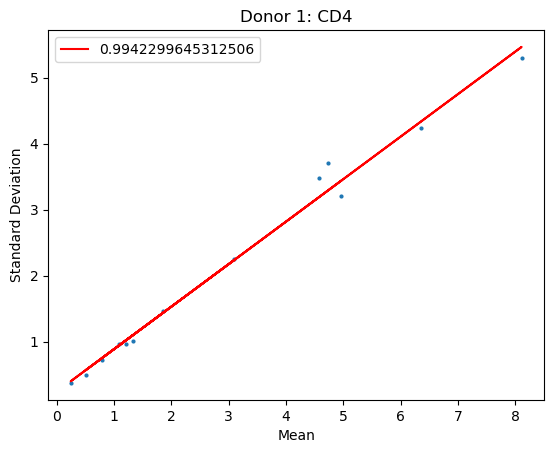

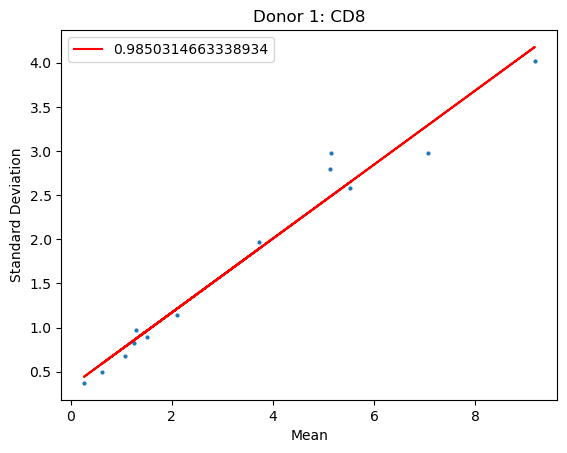

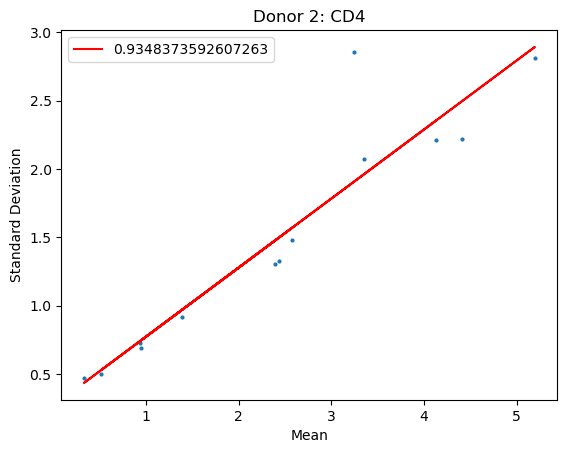

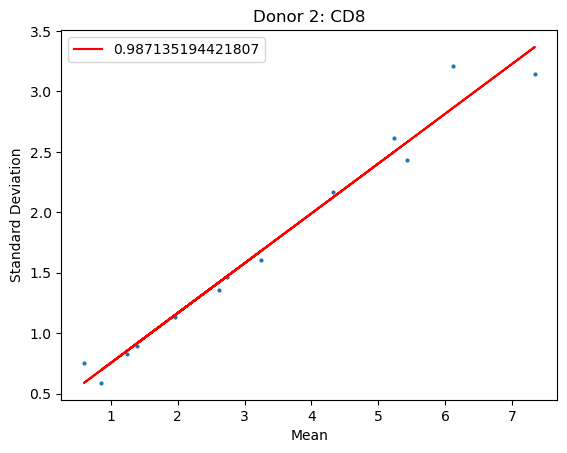

(0.4120415912045121, 0.34241226633525224)

In [40]:
mean_plot(p14_intnon_n3, 'Donor 1: CD4')
mean_plot(p18_intnon_n3, 'Donor 1: CD8')
mean_plot(p24_intnon_n3, 'Donor 2: CD4' )
mean_plot(p28_intnon_n3, 'Donor 2: CD8')

In [ ]:
fig, ax = plt.subplots(1, 1) 
ax.scatter(x,y**2,s=4)
lin_p14_n3_v=st.linregress(x,y**2)
ax.plot(x,lin_p14_n3_v.intercept+lin_p14_n3_v.slope*x,color='red',label=lin_p14_n3_v.rvalue)
ax.legend()
plt.show()
lin_p14_n3_v.slope,lin_p14_n3_v.intercept

In [ ]:
p14_nonint_n3_mean_list=[]
p14_nonint_n3_sd_list=[]
for i in intpro:
    p14_nonint_n3_mean_list.append(mean(p14_intnon_n3))
    p14_nonint_n3_sd_list.append()

In [ ]:
sns.pairplot(p14_n1).map_lower(r2)
plt.show()

In [ ]:
sns.pairplot(p14_n2).map_lower(r2)
plt.show()

In [ ]:
sns.pairplot(p14_intnon_n3).map_lower(r2)
plt.show()

Partial covariance analysis

In [ ]:
x=p14_n2['MT-ND1']
r14_n2_rval=[]
for i in intpro:
    fig, ax = plt.subplots(1, 1) 
    y=p14_n2[i]
    ax.set_title('p14'+''+i)
    lin_x=np.sqrt(x*y)
    lin_y=y
    ax.scatter(lin_x,lin_y, s=1)
    M=max(lin_x)
    m=min(lin_x)
    lin=st.linregress(lin_x,lin_y)
    l=np.array([m,M])
    ax.plot(l,lin.intercept+lin.slope*l,color='red')
    r14_n2_rval.append(lin.rvalue)
    plt.show()
r14_n2_rval

Q-Q plot

In [35]:
def qq_nbi(df, index_list , r , prob):

    dfname=str(df)
    for i in index_list:
    # Sort the data
        data = np.sort(df[i])
        p=prob[i]
    # Generate the theoretical quantiles from the negative binomial distribution
        quant = np.arange(1, len(data) + 1) / (len(data) + 1)
        neg_binom_quantiles = st.nbinom.ppf(quant, r, p)

    # Create the Q-Q plot
        fig,ax=plt.subplots(1,1)
        plt.figure(figsize=(8, 8))
        ax.scatter(neg_binom_quantiles, data, edgecolor='k', facecolor='none')
        ax.plot([min(neg_binom_quantiles), max(neg_binom_quantiles)], 
             [min(neg_binom_quantiles), max(neg_binom_quantiles)], 
             color='red', linestyle='--')
        ax.set_xlabel('Theoretical Quantiles (Negative Binomial)')
        ax.set_ylabel( i + ' Sample' 'Quantiles')
        ax.set_title('Q-Q:' + i+  ' vs Negative Binomial Distribution')
        ax.grid(True)
        plt.show()


In [ ]:
qq_nbi(p14_n1,intpro,100,uem14_list_n1)

In [ ]:
qq_nbi(p14_n2,intpro,1000,uem14_list_n2)

In [ ]:
p14_intnon

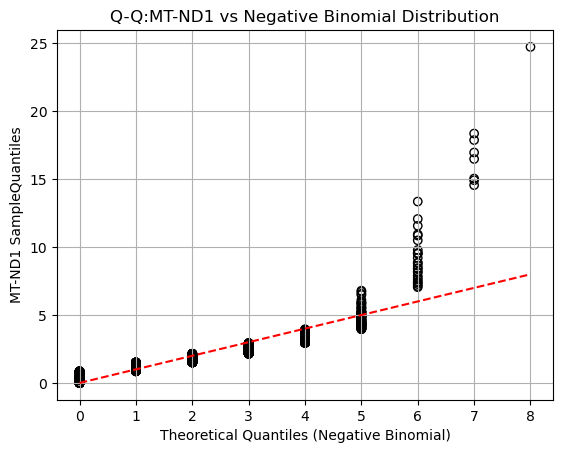

<Figure size 800x800 with 0 Axes>

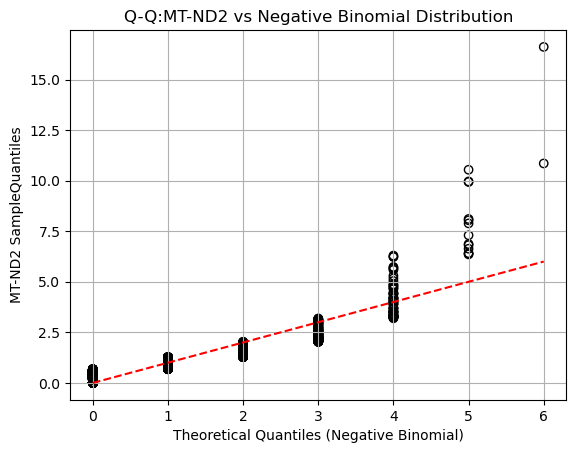

<Figure size 800x800 with 0 Axes>

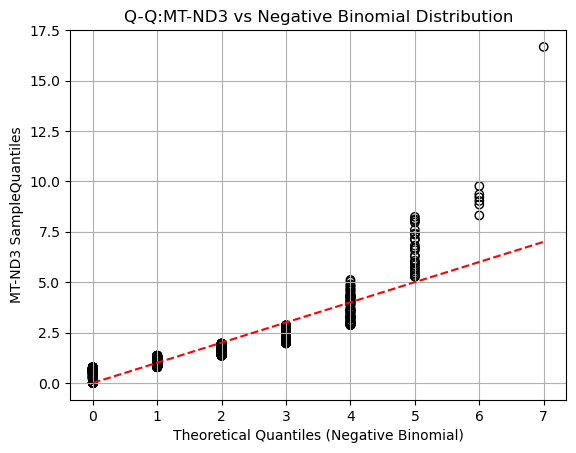

<Figure size 800x800 with 0 Axes>

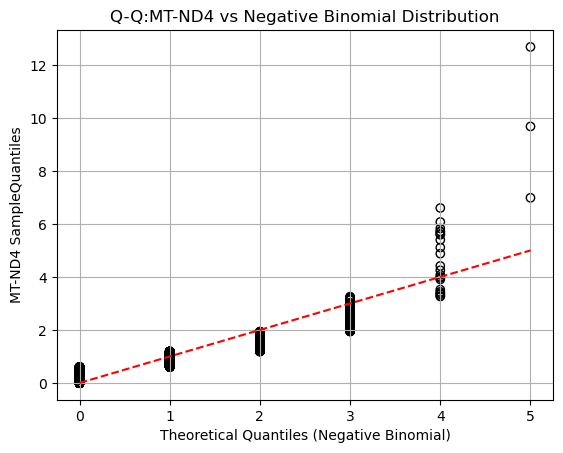

<Figure size 800x800 with 0 Axes>

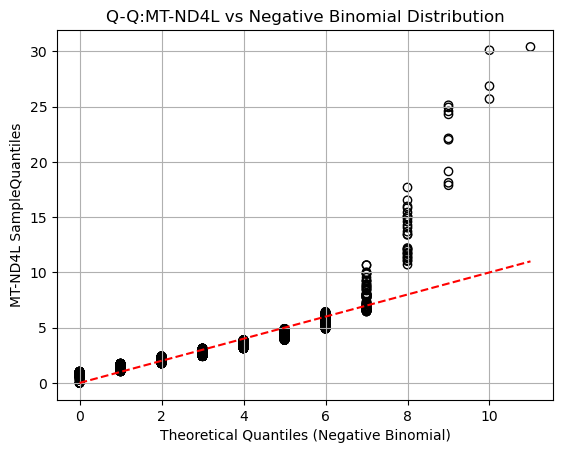

<Figure size 800x800 with 0 Axes>

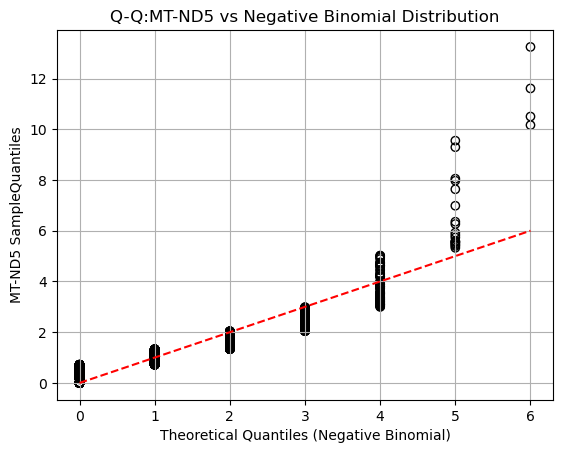

<Figure size 800x800 with 0 Axes>

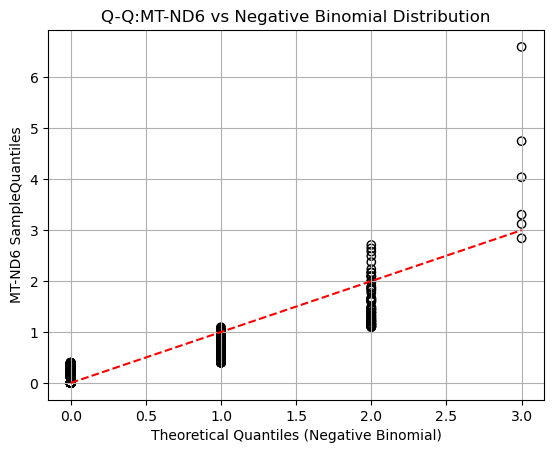

<Figure size 800x800 with 0 Axes>

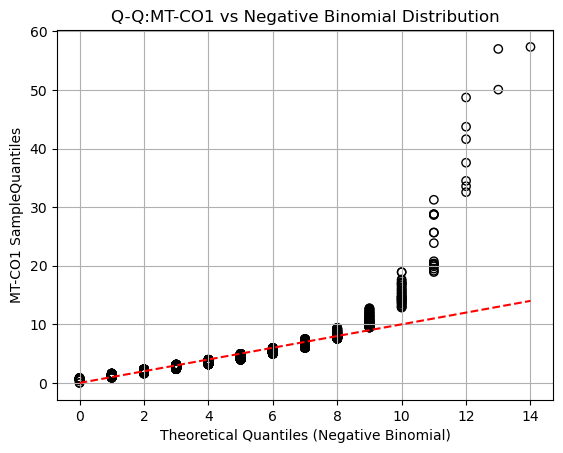

<Figure size 800x800 with 0 Axes>

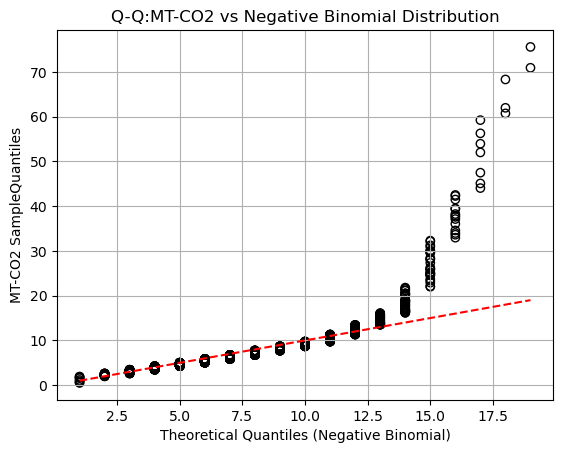

<Figure size 800x800 with 0 Axes>

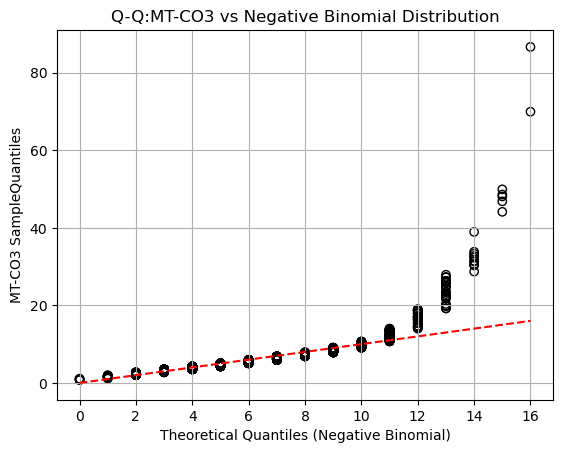

<Figure size 800x800 with 0 Axes>

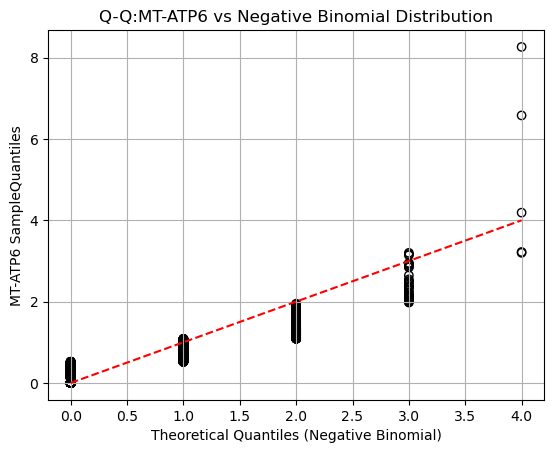

<Figure size 800x800 with 0 Axes>

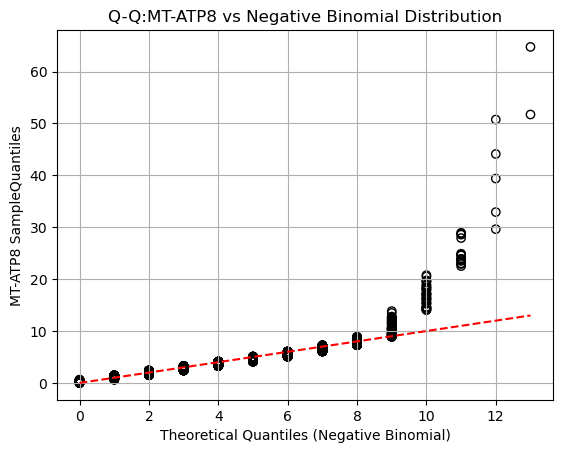

<Figure size 800x800 with 0 Axes>

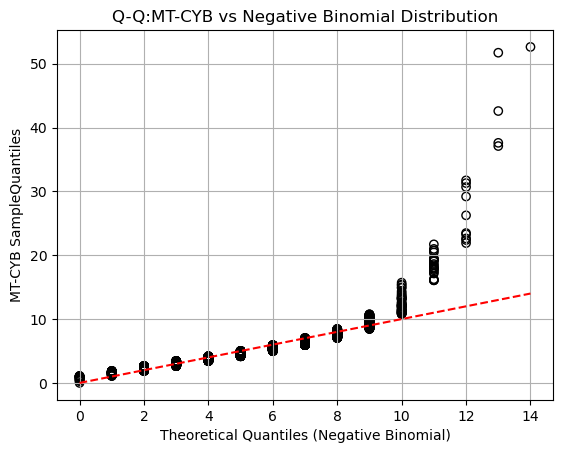

<Figure size 800x800 with 0 Axes>

In [36]:
qq_nbi(p14_intnon_n3,intpro,1000,uem14_non_list_n3)

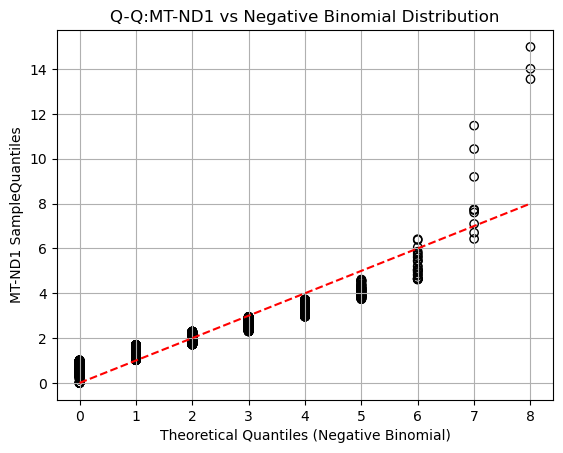

<Figure size 800x800 with 0 Axes>

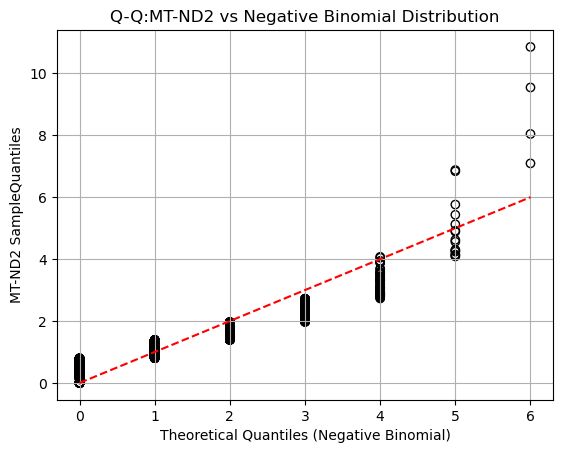

<Figure size 800x800 with 0 Axes>

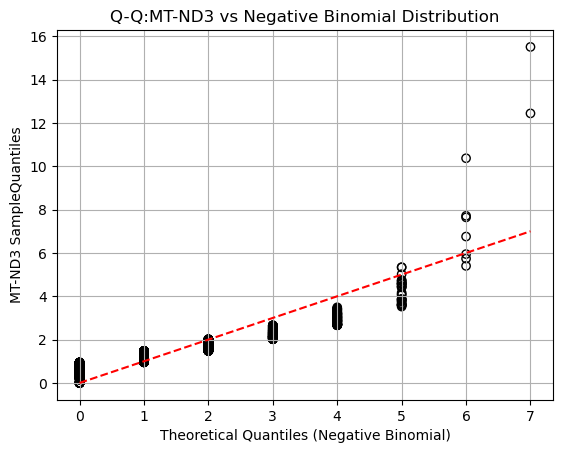

<Figure size 800x800 with 0 Axes>

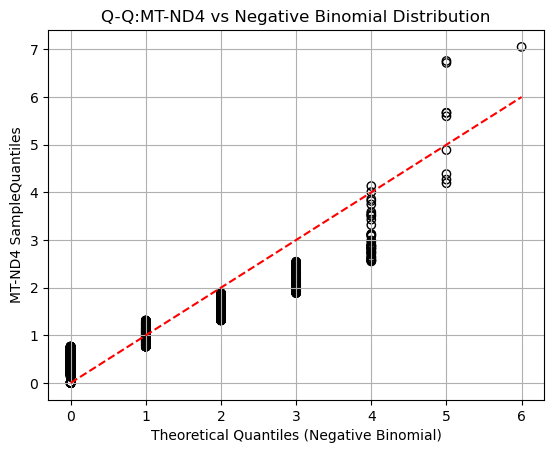

<Figure size 800x800 with 0 Axes>

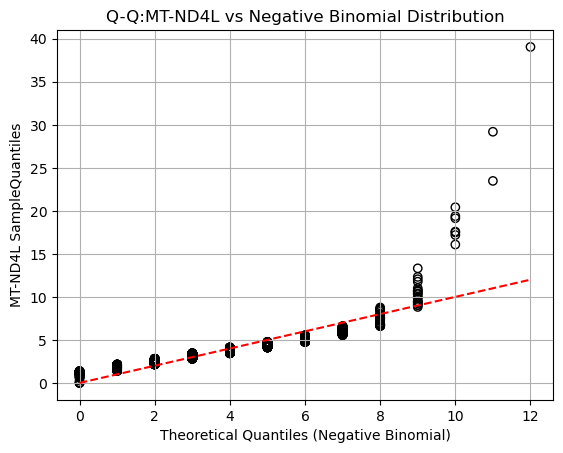

<Figure size 800x800 with 0 Axes>

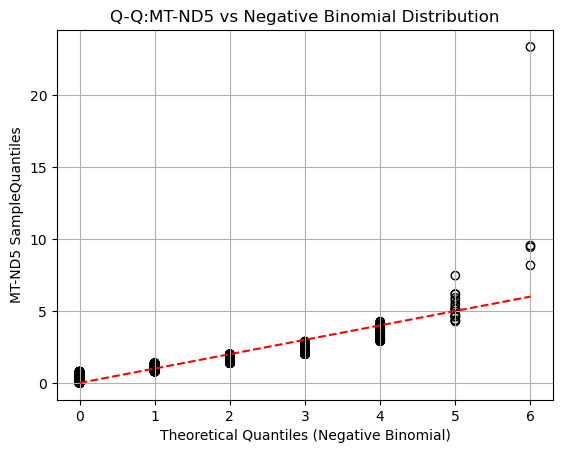

<Figure size 800x800 with 0 Axes>

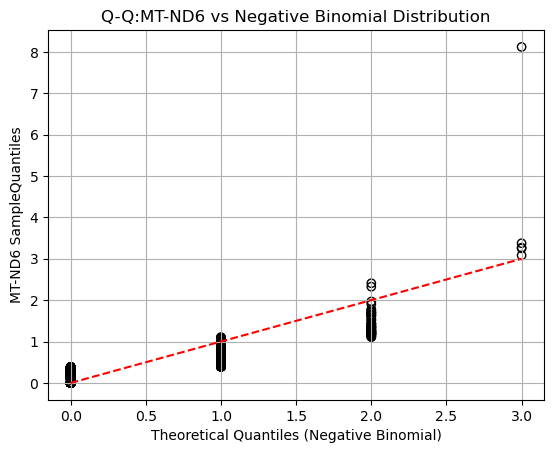

<Figure size 800x800 with 0 Axes>

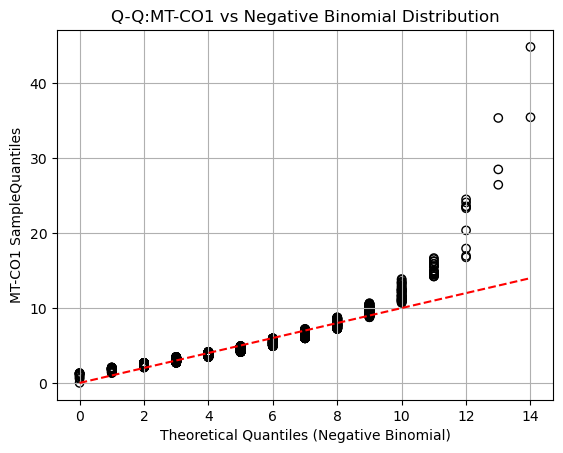

<Figure size 800x800 with 0 Axes>

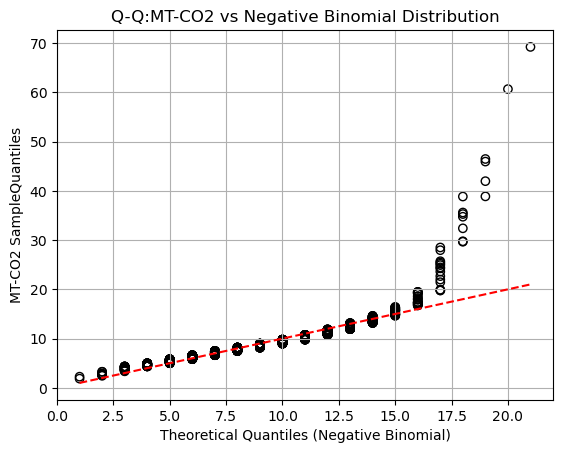

<Figure size 800x800 with 0 Axes>

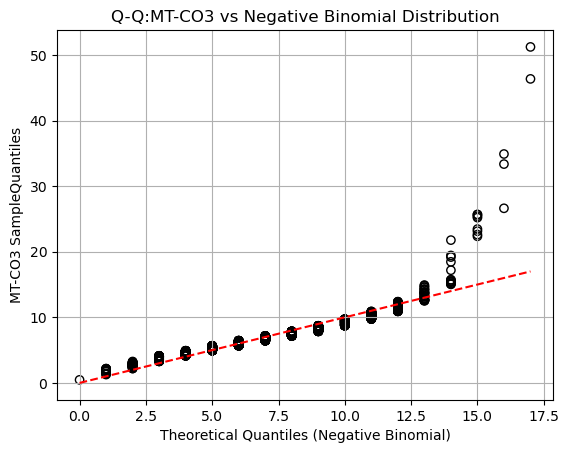

<Figure size 800x800 with 0 Axes>

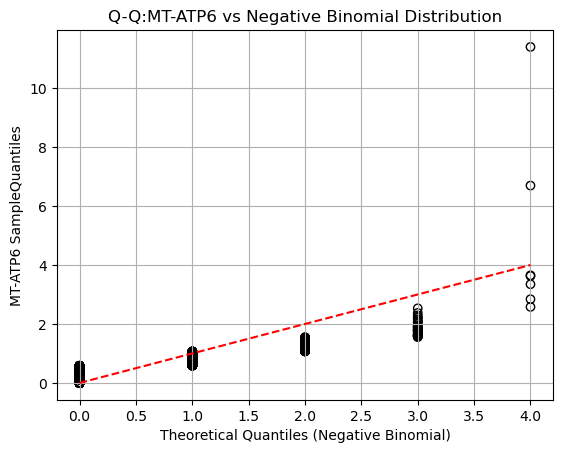

<Figure size 800x800 with 0 Axes>

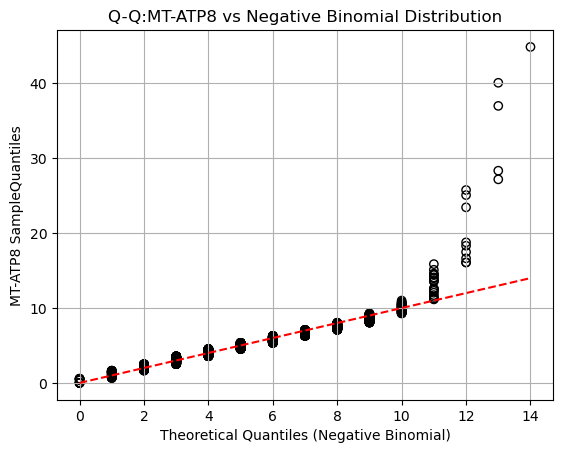

<Figure size 800x800 with 0 Axes>

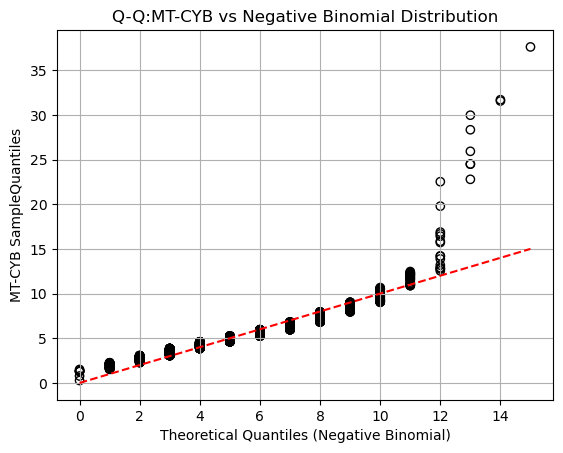

<Figure size 800x800 with 0 Axes>

In [37]:
qq_nbi(p18_intnon_n3,intpro,1000,uem18_non_list_n3)

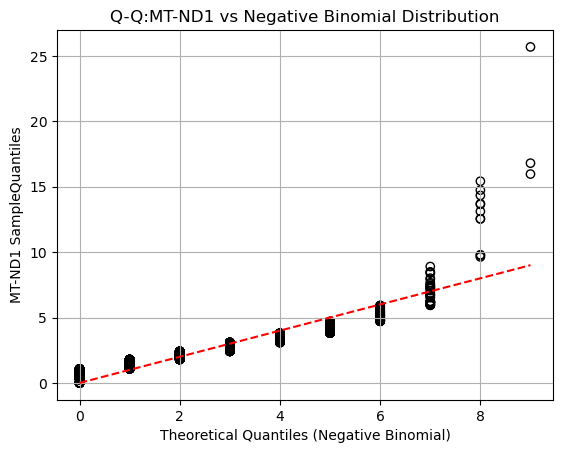

<Figure size 800x800 with 0 Axes>

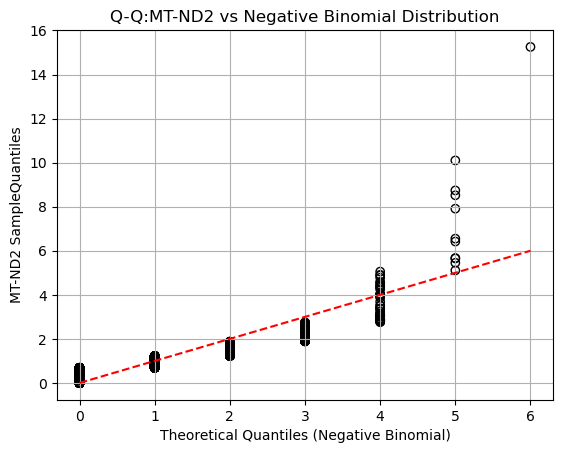

<Figure size 800x800 with 0 Axes>

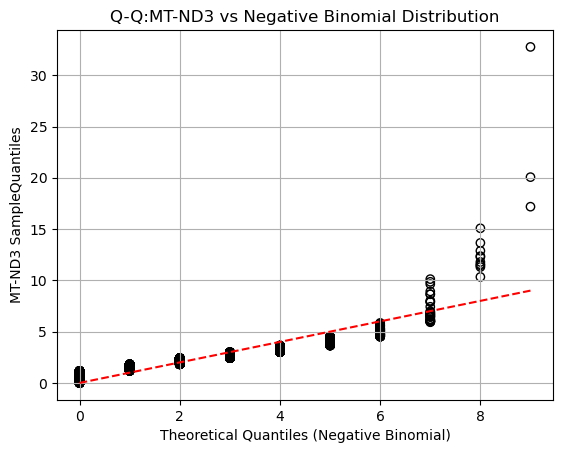

<Figure size 800x800 with 0 Axes>

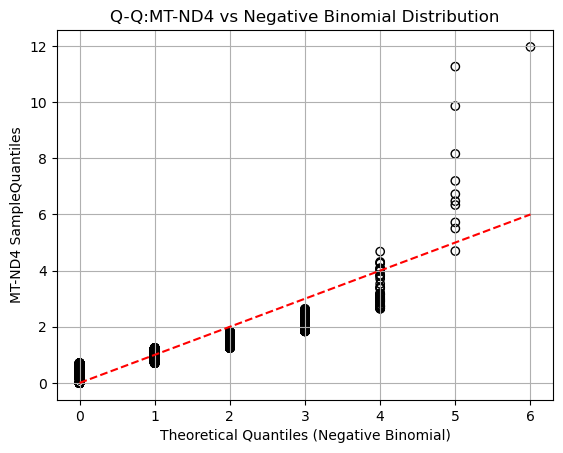

<Figure size 800x800 with 0 Axes>

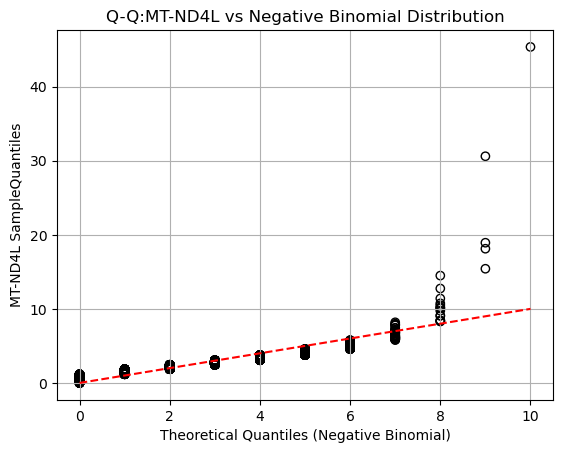

<Figure size 800x800 with 0 Axes>

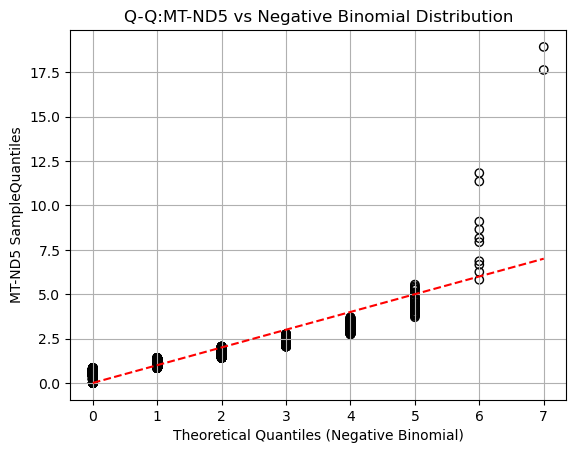

<Figure size 800x800 with 0 Axes>

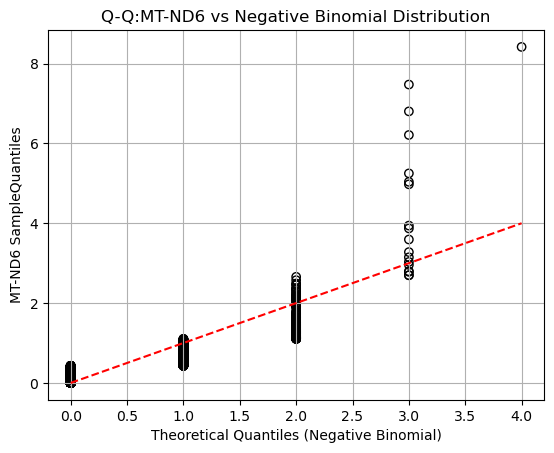

<Figure size 800x800 with 0 Axes>

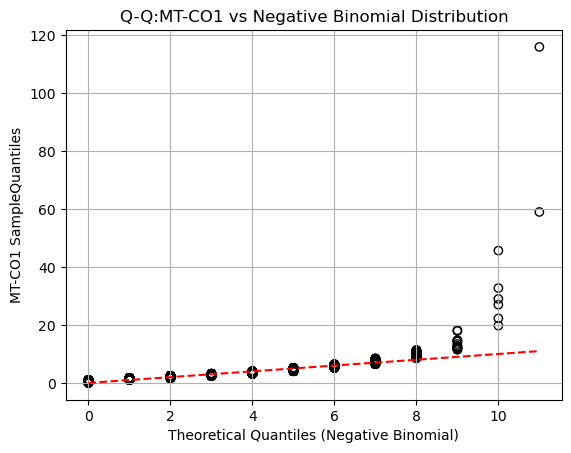

<Figure size 800x800 with 0 Axes>

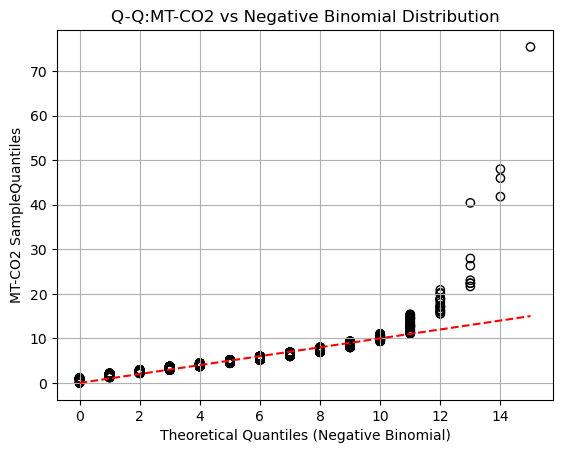

<Figure size 800x800 with 0 Axes>

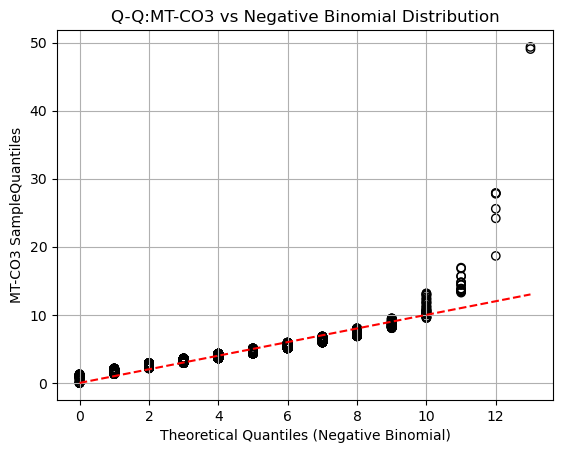

<Figure size 800x800 with 0 Axes>

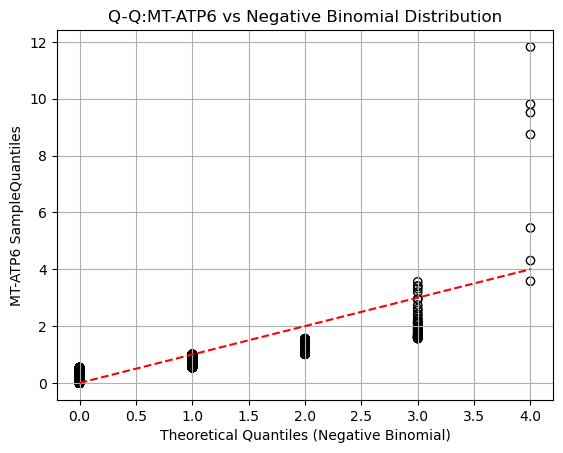

<Figure size 800x800 with 0 Axes>

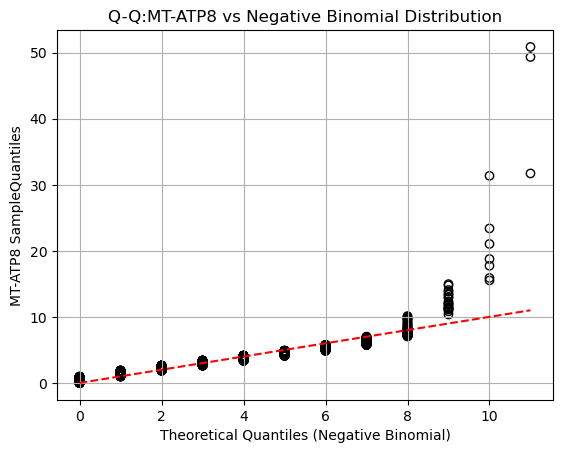

<Figure size 800x800 with 0 Axes>

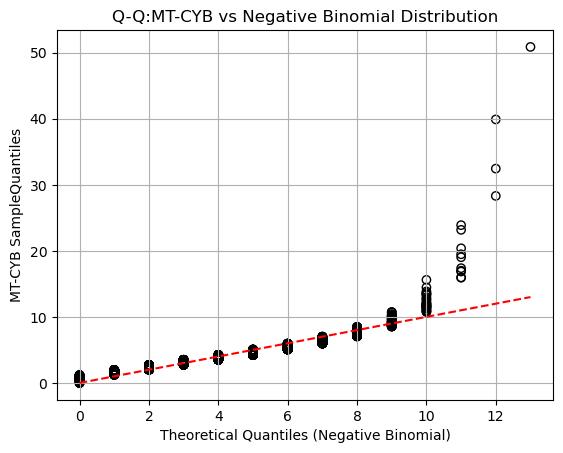

<Figure size 800x800 with 0 Axes>

In [38]:
qq_nbi(p24_intnon_n3,intpro,1000,uem24_non_list_n3)

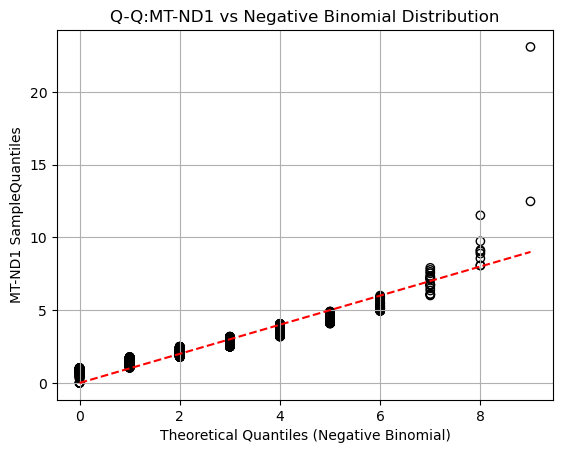

<Figure size 800x800 with 0 Axes>

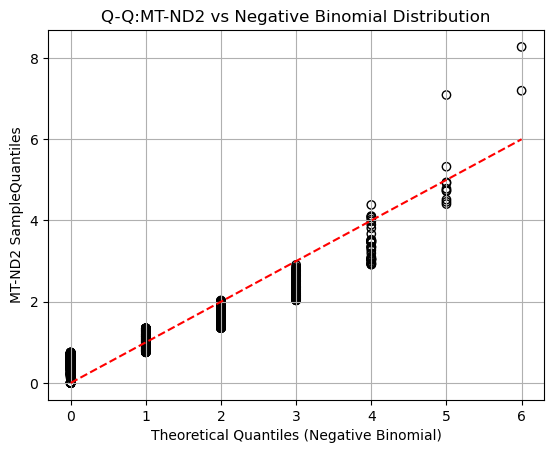

<Figure size 800x800 with 0 Axes>

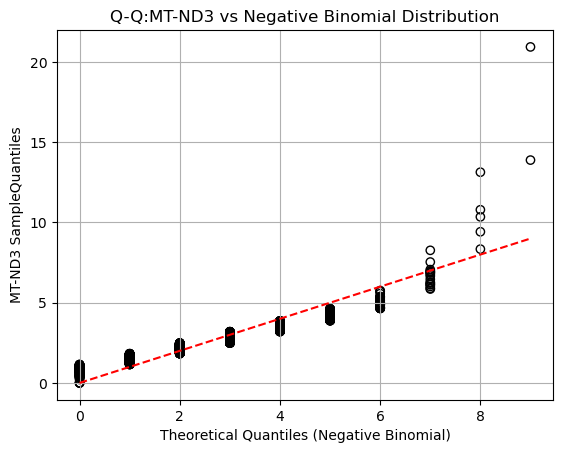

<Figure size 800x800 with 0 Axes>

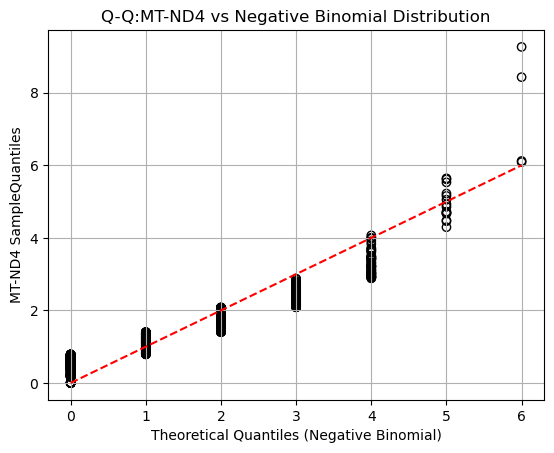

<Figure size 800x800 with 0 Axes>

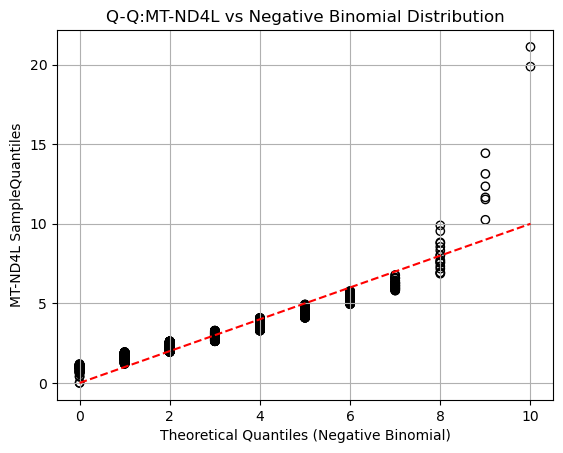

<Figure size 800x800 with 0 Axes>

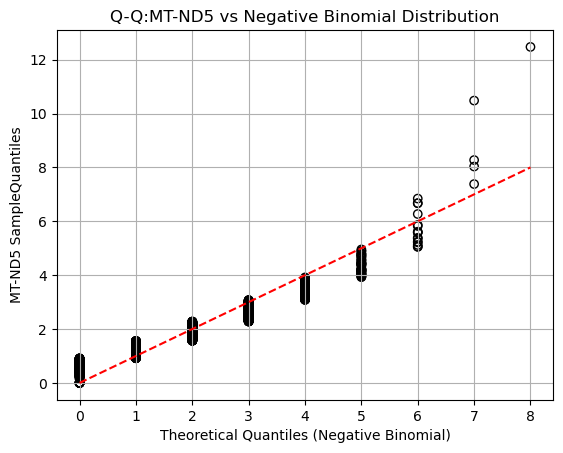

<Figure size 800x800 with 0 Axes>

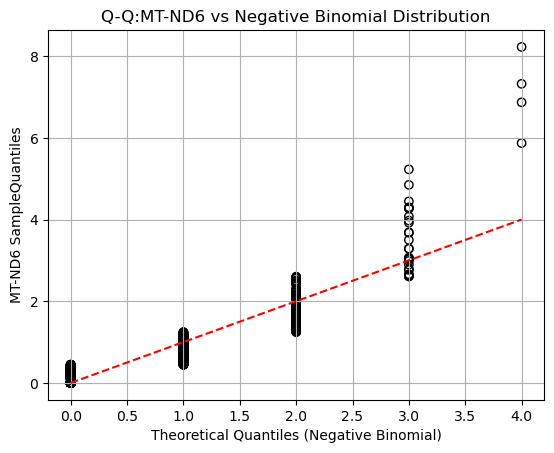

<Figure size 800x800 with 0 Axes>

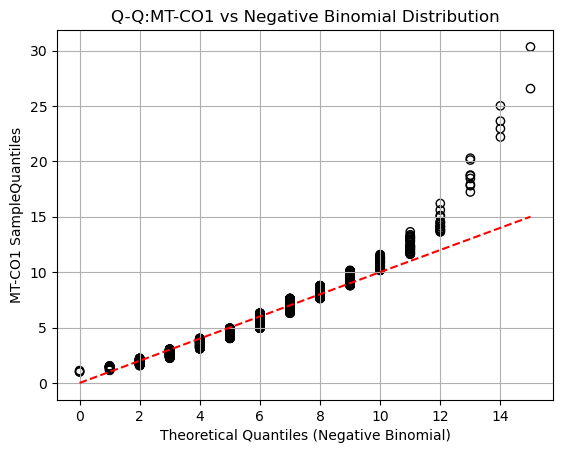

<Figure size 800x800 with 0 Axes>

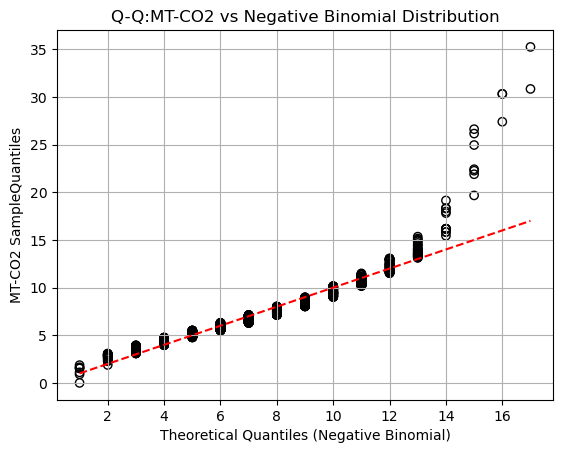

<Figure size 800x800 with 0 Axes>

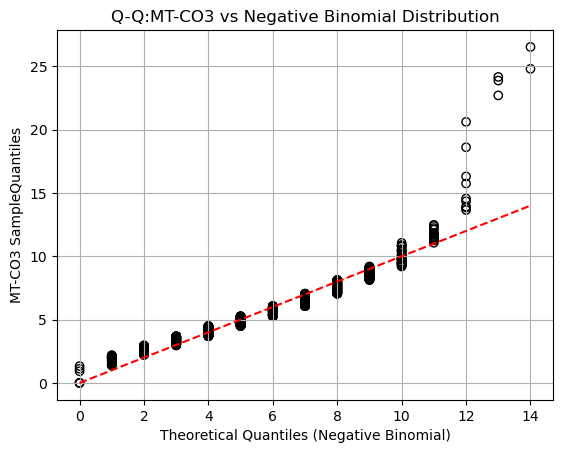

<Figure size 800x800 with 0 Axes>

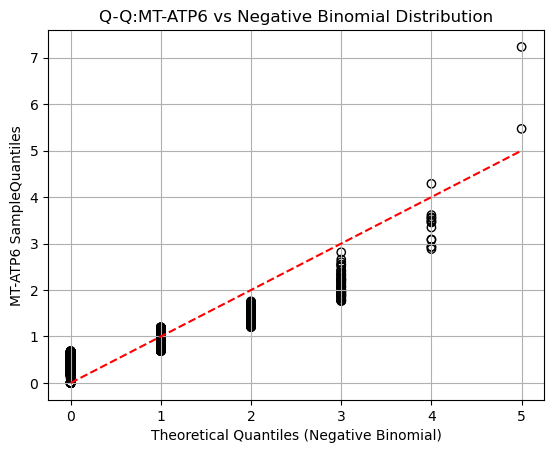

<Figure size 800x800 with 0 Axes>

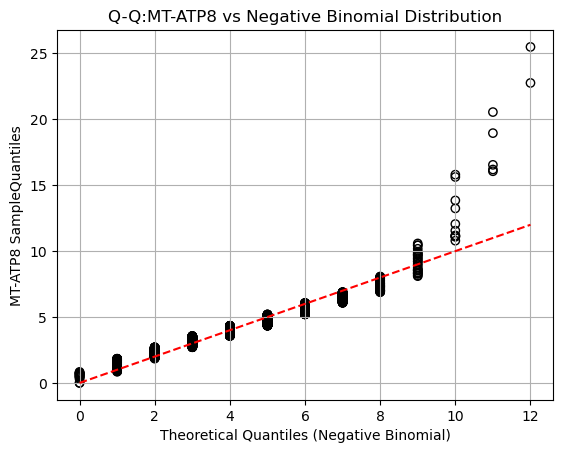

<Figure size 800x800 with 0 Axes>

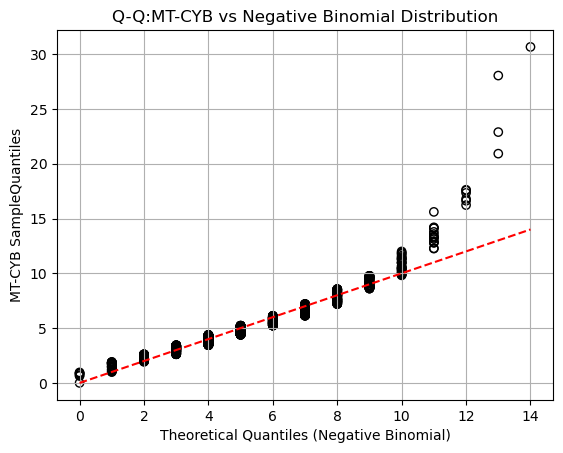

<Figure size 800x800 with 0 Axes>

In [39]:
qq_nbi(p28_intnon_n3,intpro,1000,uem28_non_list_n3)

In [ ]:
copro=['MT-CO1', 'MT-CO2', 'MT-CO3']
for i in copro:
    r=1000
    data=np.sort(p14_intnon_n3[i])
    p=uem14_non_list_n3[i]
    quant = np.arange(1, len(data) + 1) / (len(data) + 1)
    nbi_quant = st.nbinom.ppf(quant, r, p)
    fig,ax=plt.subplots(1,1)
    plt.figure(figsize=(8, 8))
    ax.scatter(nbi_quant, 3*np.log(data+1), edgecolor='k', facecolor='none')
    ax.plot([min(nbi_quant), max(nbi_quant)], 
             [min(nbi_quant), max(nbi_quant)], 
             color='red', linestyle='--')
    ax.set_xlabel('Theoretical Quantiles (Negative Binomial)')
    ax.set_ylabel( i + ' Sample' 'Quantiles')
    ax.set_title('Q-Q 1_4:' + i+  ' vs Negative Binomial Distribution')
    ax.grid(True)
    plt.show()

PPC to test consistency of proportion variable

In [ ]:
def ppc_nbi(df,index_list, samp_prob, r):
    import arviz as az
    for i in index_list:
        nbi_model=pm.Model()
        l=min(samp_prob[i])
        up=max(samp_prob[i])
        with nbi_model:
            p_prior=pm.Uniform('p'+i,lower=l,upper=up) #prior
            obs=pm.NegativeBinomial('obs', p=p_prior,n=r, observed=df[i]) #likelihood
            trace=pm.sample(1000,return_inferencedata=True)
            az.plot_trace(trace)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 42 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 34 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 34 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 34 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4L]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 35 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND5]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 33 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 35 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 35 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 35 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 35 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 35 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP8]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 35 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CYB]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 36 seconds.


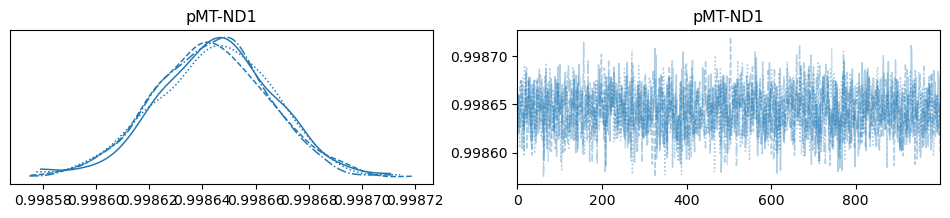

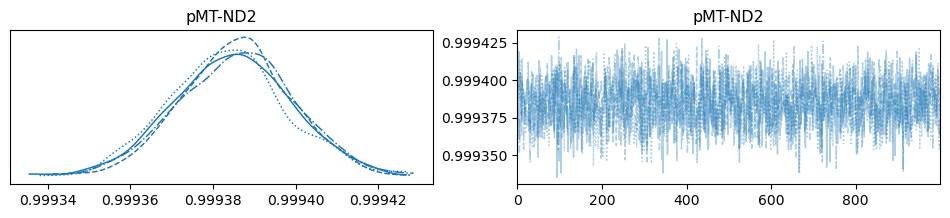

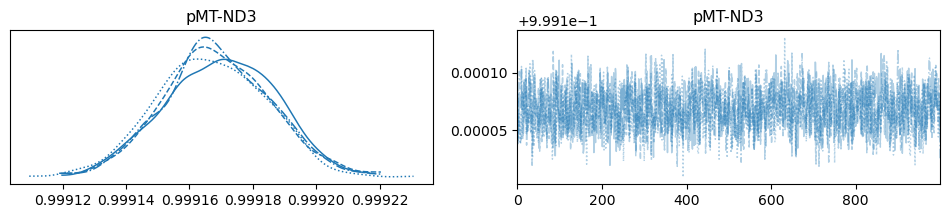

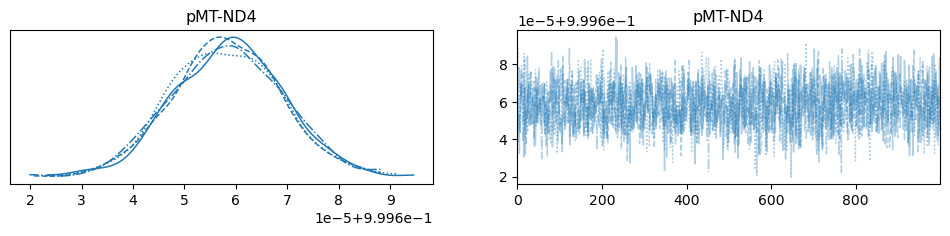

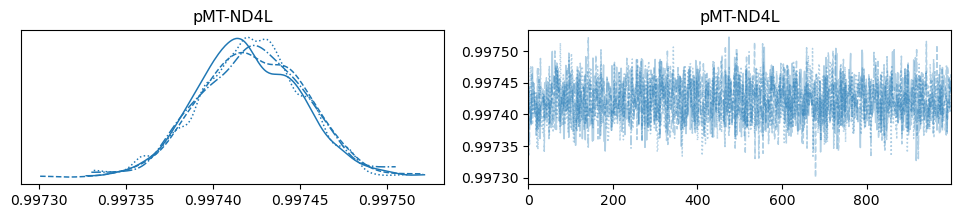

...

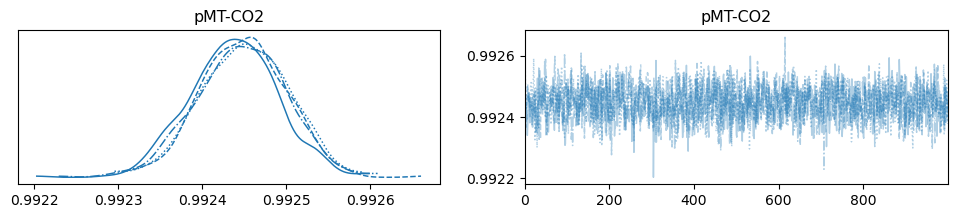

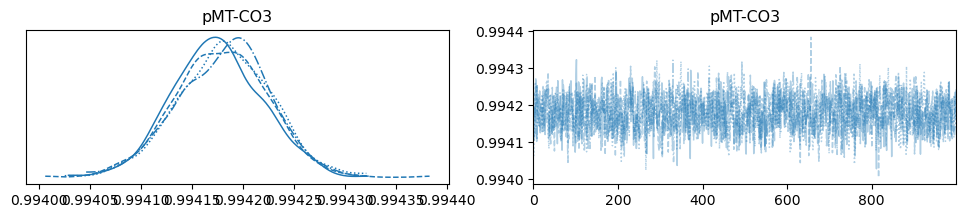

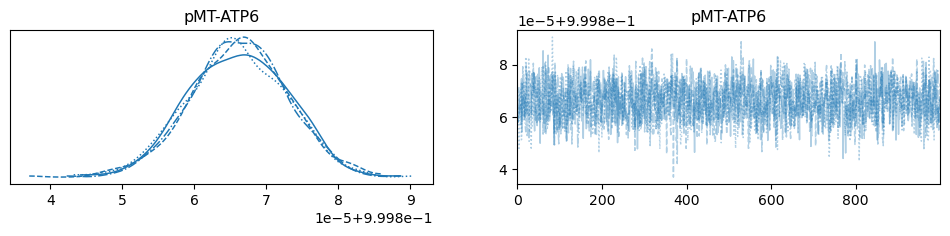

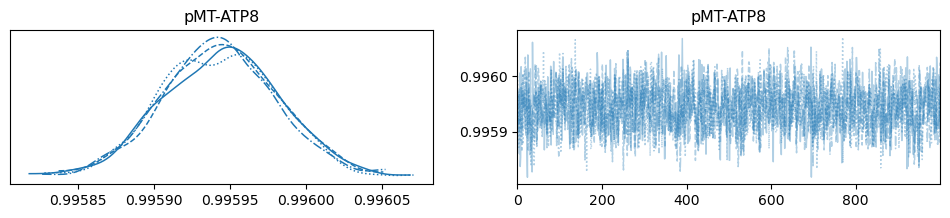

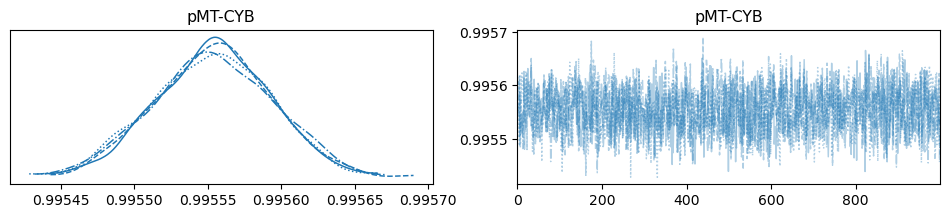

In [124]:
ppc_nbi(p14_intnon_n3,intpro,uem14_non_samp_n3,1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 27 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 27 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 26 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4L]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND5]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 31 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 31 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 31 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 26 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 25 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP8]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CYB]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.


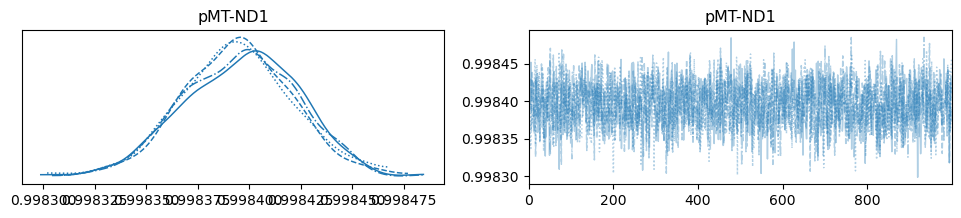

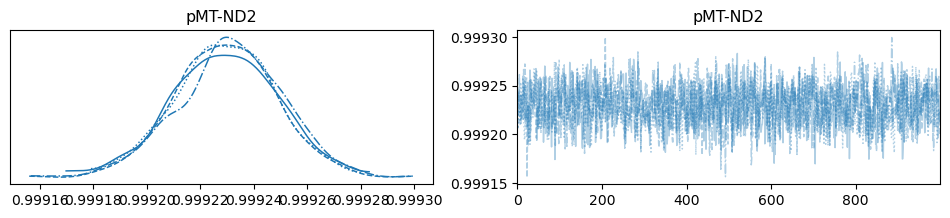

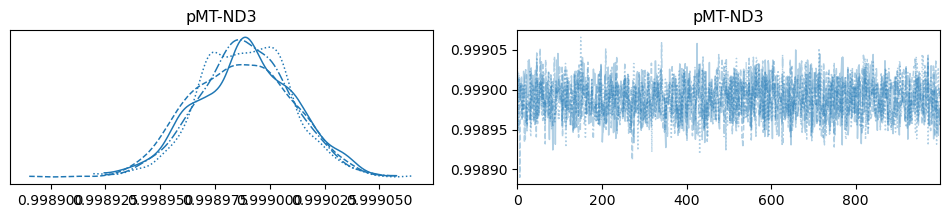

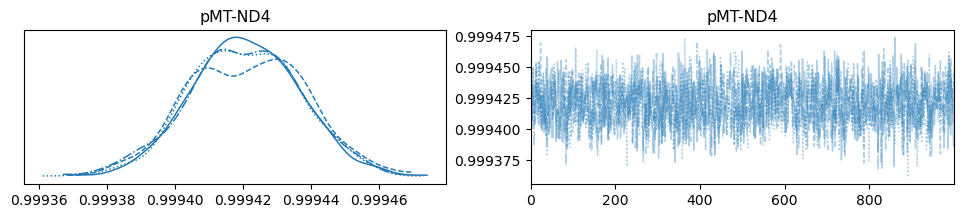

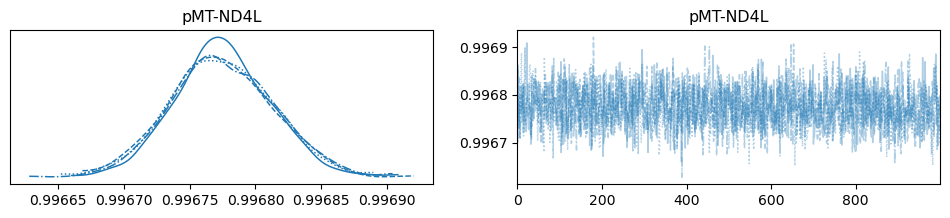

...

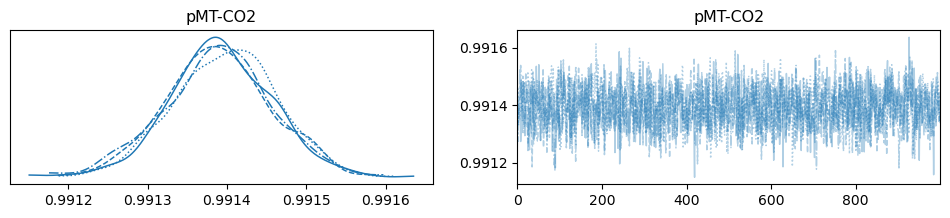

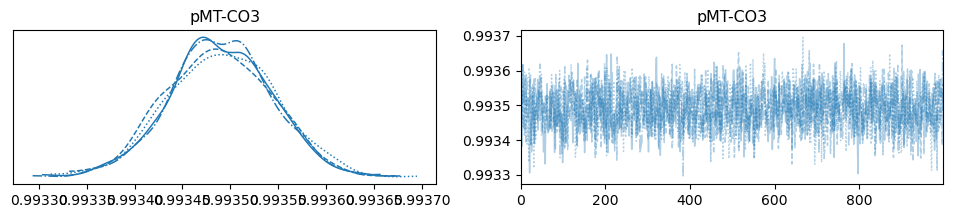

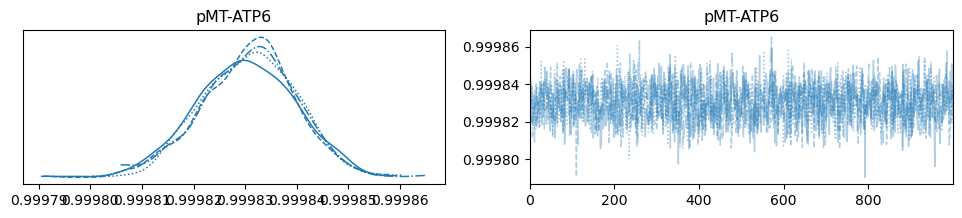

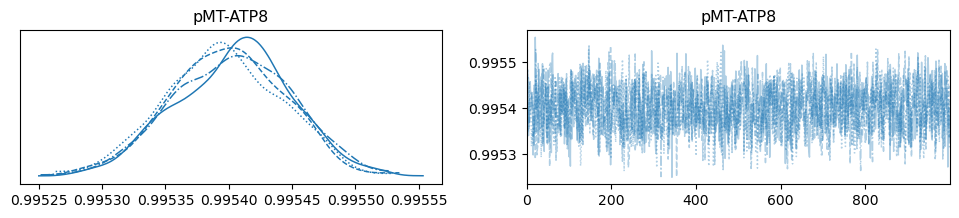

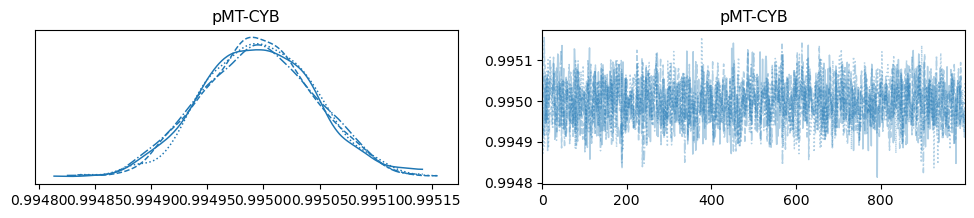

In [125]:
ppc_nbi(p18_intnon_n3,intpro,uem18_non_samp_n3,1000)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4L]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND5]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP8]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CYB]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.


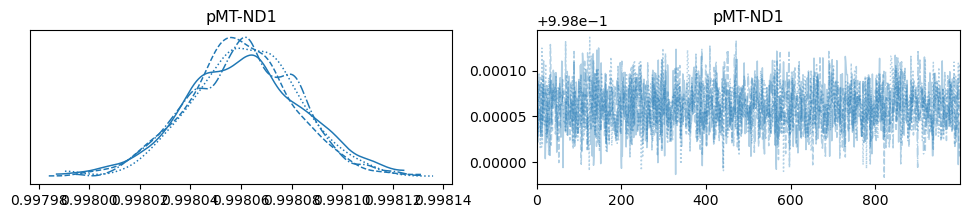

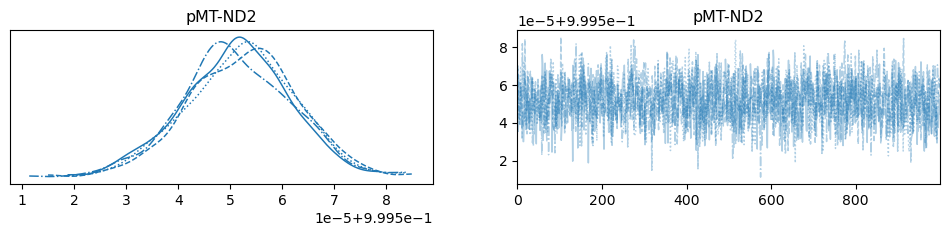

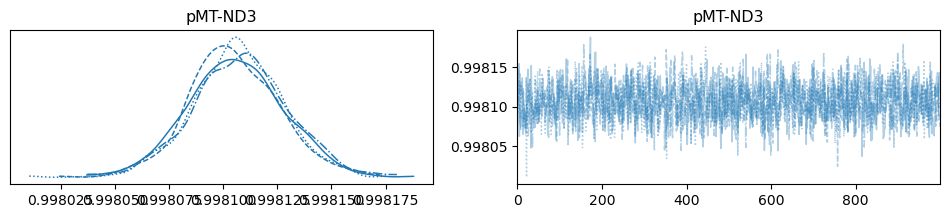

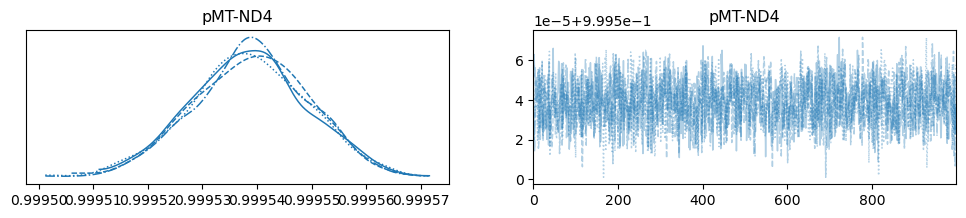

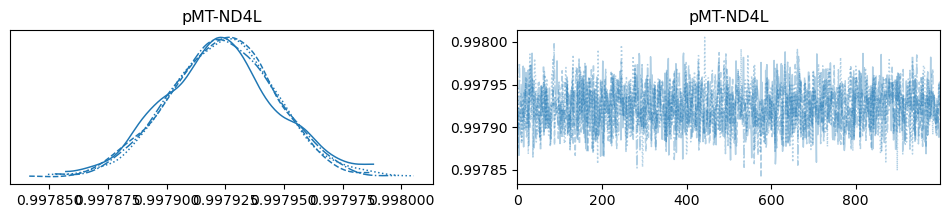

...

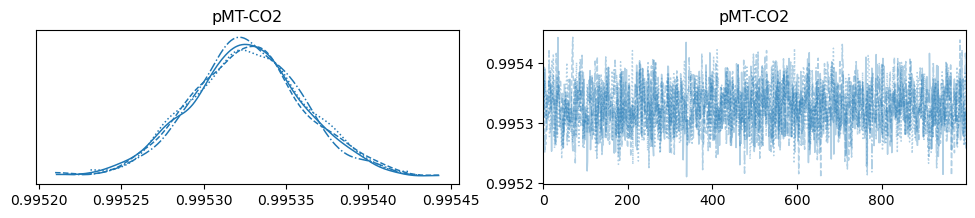

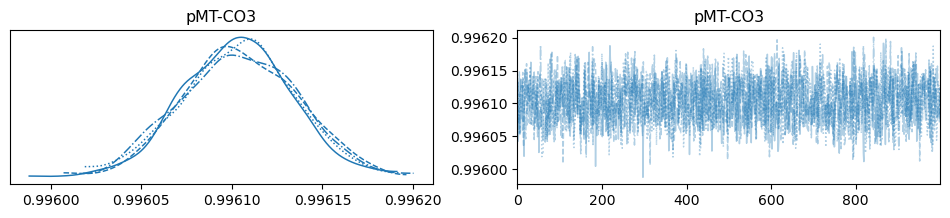

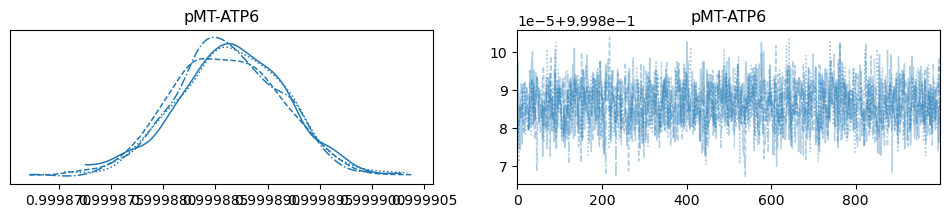

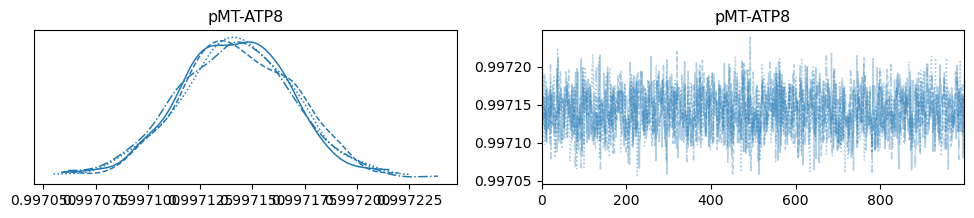

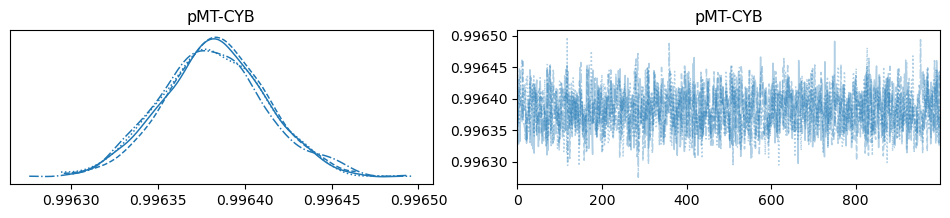

In [126]:
ppc_nbi(p24_intnon_n3,intpro,uem24_non_samp_n3,1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 31 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4L]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 32 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND5]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 36 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 36 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 36 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 36 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 36 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 36 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP8]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 37 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CYB]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 36 seconds.


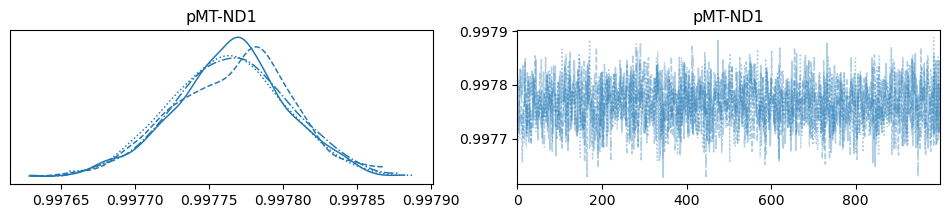

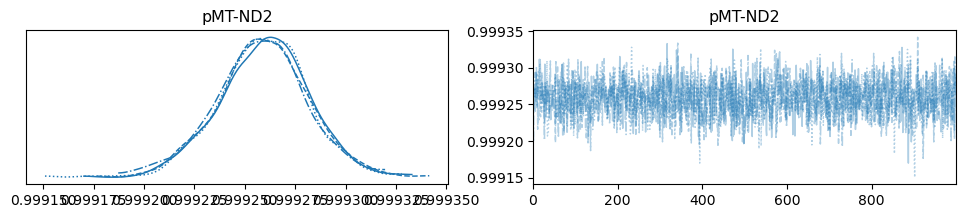

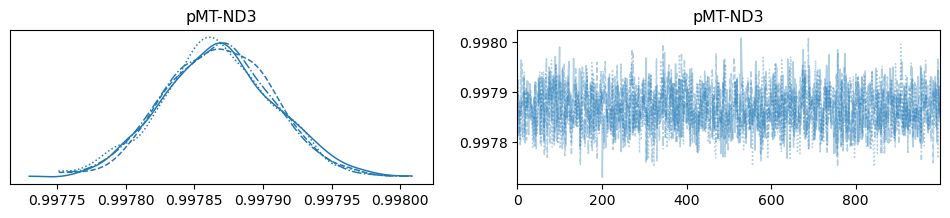

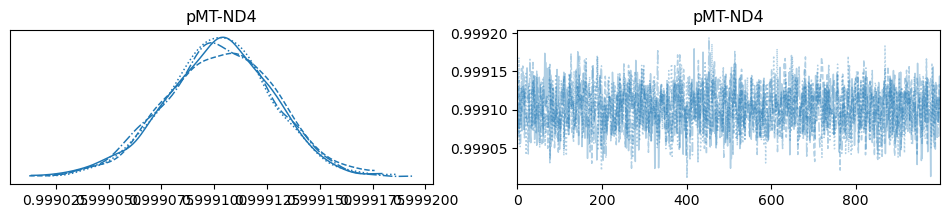

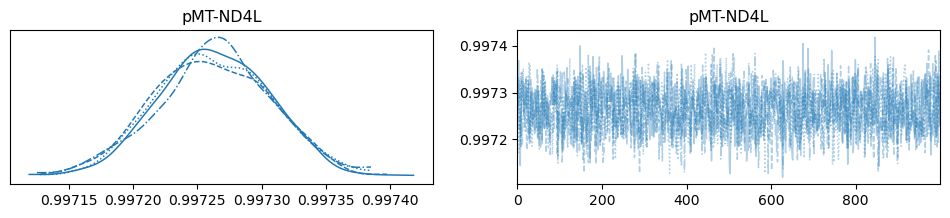

...

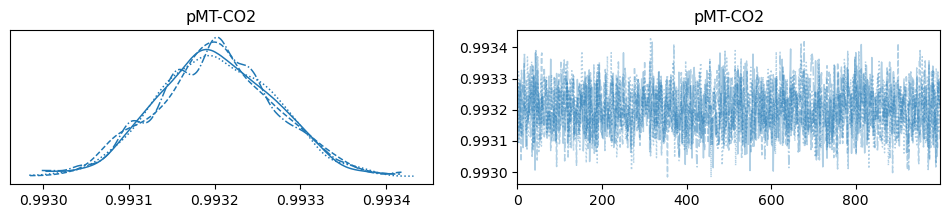

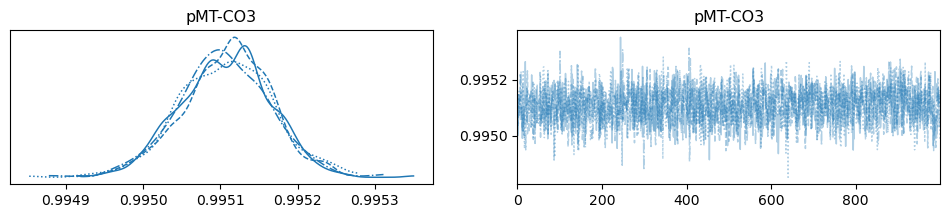

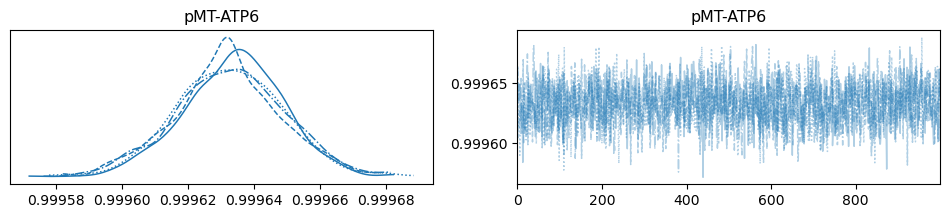

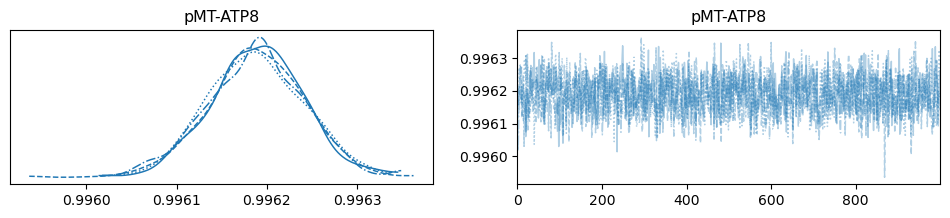

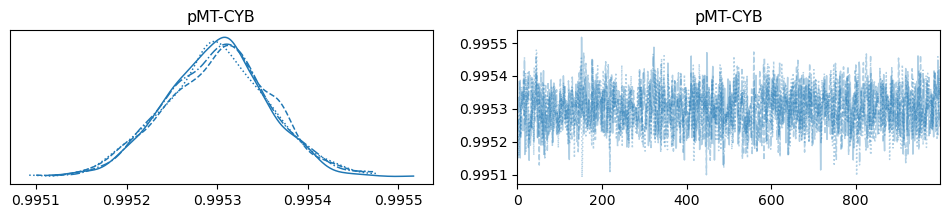

In [127]:
ppc_nbi(p28_intnon_n3,intpro,uem28_non_samp_n3,1000)

PPC nbi with unif prior

In [128]:
def ppc_nbi_uni(df,index_list, samp_prob, r):
    import arviz as az
    for i in index_list:
        nbi_model=pm.Model()
        with nbi_model:
            p_prior=pm.Uniform('p'+i,lower=0,upper=1) #prior
            obs=pm.NegativeBinomial('obs', p=p_prior,n=r, observed=df[i]) #likelihood
            trace=pm.sample(1000,return_inferencedata=True)
            az.plot_trace(trace)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 50 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 54 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 58 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 42 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND4L]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 45 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND5]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 44 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ND6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 46 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO1]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 44 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO2]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 44 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CO3]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 44 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP6]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 43 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-ATP8]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 44 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [pMT-CYB]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 43 seconds.


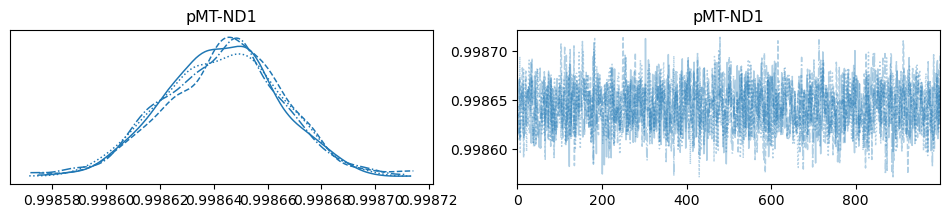

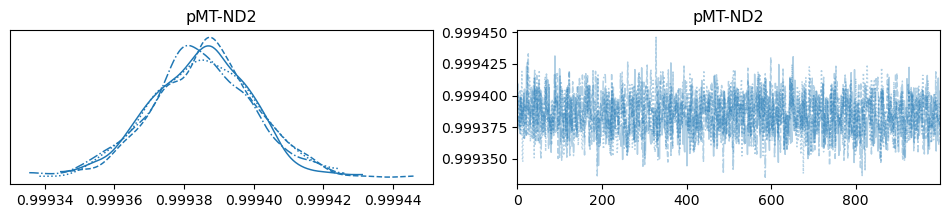

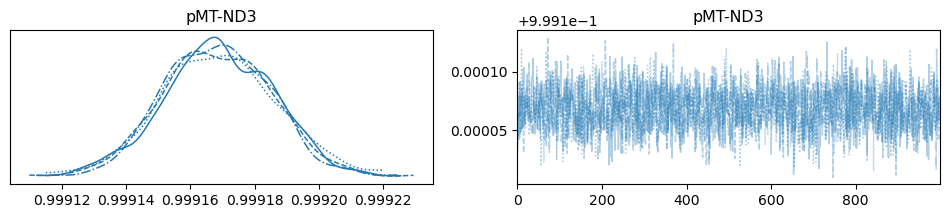

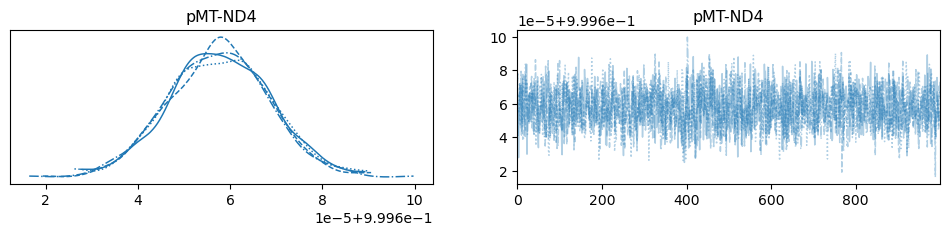

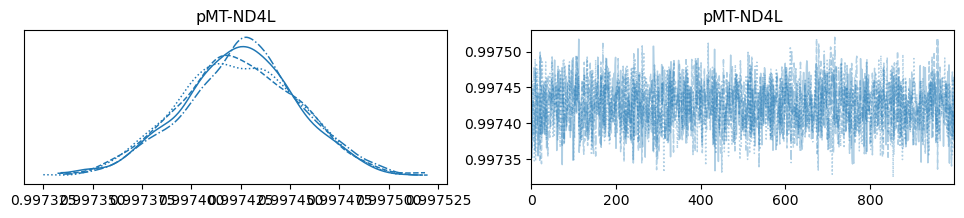

...

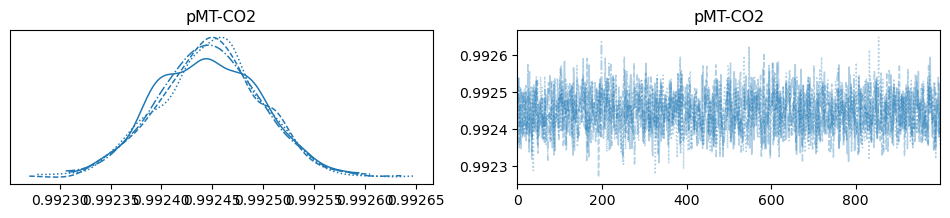

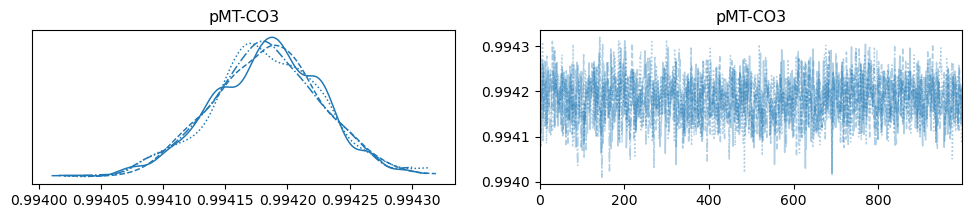

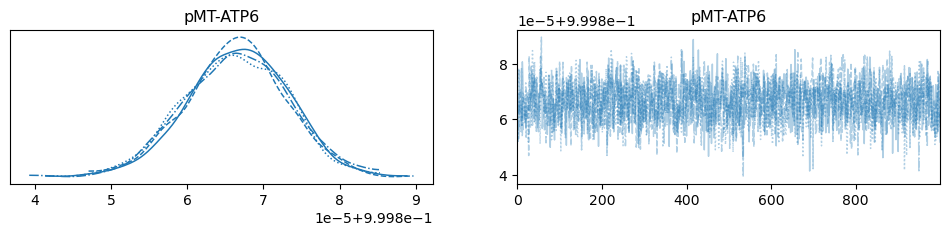

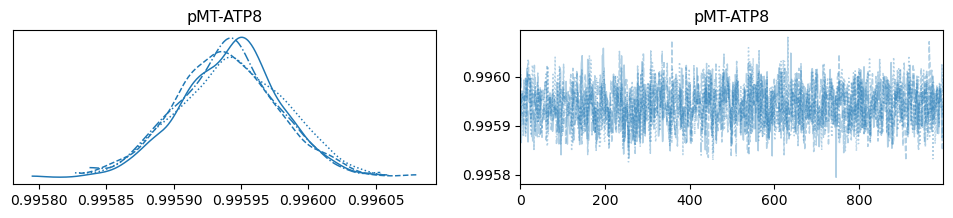

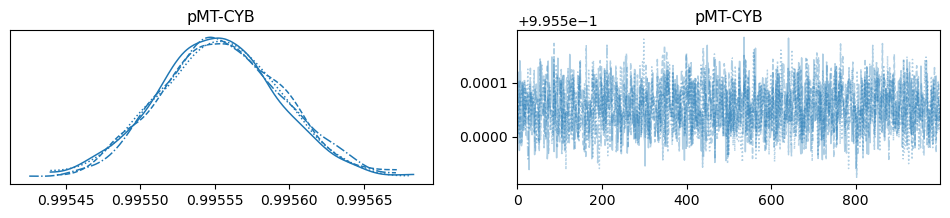

In [129]:
ppc_nbi_uni(p14_intnon_n3,intpro,uem14_non_samp_n3,1000)

PPC Poisson

In [ ]:
def ppc_poi(df,index_list):
    import arviz as az
    for i in index_list:
        nbi_model=pm.Model()
        l=min(df[i])
        up=max(df[i])
        with nbi_model:
            mu_prior=pm.Uniform('mu'+i,lower=l,upper=up) #prior
            obs=pm.Poisson('obs', mu=mu_prior, observed=df[i]) #likelihood
            trace=pm.sample(1000,return_inferencedata=True)
            az.plot_trace(trace)

In [ ]:
ppc_poi(p14_ruiz_n1,intpro)

2nd way: Poi-Gam MLE

In [17]:
def poigam_mle(df,index_list,r):
    prob=[]
    for i in index_list:
        su=sum(df[i])
        n=len(df)
        prob.append(n*r/(su+n*r))
    prob=dict(zip(index_list,prob))
    return prob

In [18]:
mle14_list_n3=poigam_mle(p14_intnon,intpro,1000)
mle24_list_n3=poigam_mle(p24_intnon,intpro,1000)
mle18_list_n3=poigam_mle(p18_intnon,intpro,1000)
mle28_list_n3=poigam_mle(p28_intnon,intpro,1000)

In [38]:
mle28_list_n3

{'MT-ND1': 0.9972653235118343,
 'MT-ND2': 0.9987651715111849,
 'MT-ND3': 0.9973850531517401,
 'MT-ND4': 0.998614010380022,
 'MT-ND4L': 0.9967604829793605,
 'MT-ND5': 0.9980454611432331,
 'MT-ND6': 0.9994029967376771,
 'MT-CO1': 0.9939201131329434,
 'MT-CO2': 0.9927093110936341,
 'MT-CO3': 0.9945990757947196,
 'MT-ATP6': 0.9991531495878507,
 'MT-ATP8': 0.9957005248916933,
 'MT-CYB': 0.9947954765330203}

Chi square test for poi-gam

In [24]:
p14_pg_chi2_res=dict(zip(intpro,chi2_res_nbi(p14_intnon,intpro,mle14_list_n3,r=1000,alp=0.95)))
p18_pg_chi2_res=dict(zip(intpro,chi2_res_nbi(p18_intnon,intpro,mle18_list_n3,r=1000,alp=0.95)))
p24_pg_chi2_res=dict(zip(intpro,chi2_res_nbi(p24_intnon,intpro,mle24_list_n3,r=1000,alp=0.95)))
p28_pg_chi2_res=dict(zip(intpro,chi2_res_nbi(p28_intnon,intpro,mle28_list_n3,r=1000,alp=0.95)))

In [25]:
p14_pg_chi2_res

{'MT-ND1': 857.1598004950328,
 'MT-ND2': 394.6784605089722,
 'MT-ND3': 979.2075956875628,
 'MT-ND4': 185.395264429725,
 'MT-ND4L': 696.1327799067119,
 'MT-ND5': 467.3879785818499,
 'MT-ND6': 3.8666424694894275,
 'MT-CO1': 747.4879508058874,
 'MT-CO2': 1449.4529039306744,
 'MT-CO3': 964.0292610943675,
 'MT-ATP6': 1.751926906401419,
 'MT-ATP8': 609.1351634154654,
 'MT-CYB': 831.9748870521959}

In [26]:
p18_pg_chi2_res

{'MT-ND1': 730.6825660175489,
 'MT-ND2': 707.067700468548,
 'MT-ND3': 1067.0658356113483,
 'MT-ND4': 572.8595946778444,
 'MT-ND4L': 574.281812716062,
 'MT-ND5': 539.685150691759,
 'MT-ND6': -18.3381853652494,
 'MT-CO1': 672.5866933717812,
 'MT-CO2': 289.20297372433913,
 'MT-CO3': 320.4342835569813,
 'MT-ATP6': 47.0429561100194,
 'MT-ATP8': 186.8837972891022,
 'MT-CYB': 336.8834312009847}

In [28]:
p24_pg_chi2_res

{'MT-ND1': 1217.941469118098,
 'MT-ND2': 547.9741327582893,
 'MT-ND3': 1609.5972553051602,
 'MT-ND4': 789.0795025584431,
 'MT-ND4L': 1471.4162409807004,
 'MT-ND5': 1433.4434173878556,
 'MT-ND6': 9.933815090897777,
 'MT-CO1': 902.0144823132742,
 'MT-CO2': 638.7245216380263,
 'MT-CO3': 738.82189332554,
 'MT-ATP6': 16.277168315596477,
 'MT-ATP8': 770.3558608030172,
 'MT-CYB': 752.14188526244}

In [30]:
p28_pg_chi2_res

{'MT-ND1': 295.01264508542397,
 'MT-ND2': 326.1648266158579,
 'MT-ND3': 383.12263449643297,
 'MT-ND4': 389.23246578234426,
 'MT-ND4L': 292.53921810841763,
 'MT-ND5': 350.36931737308845,
 'MT-ND6': 19.968066301055806,
 'MT-CO1': 240.38139366063172,
 'MT-CO2': 163.43836302935844,
 'MT-CO3': 144.88125774072373,
 'MT-ATP6': 166.7423302527272,
 'MT-ATP8': 156.35826226999097,
 'MT-CYB': 124.07452676488921}

QQ plot for poi-gam

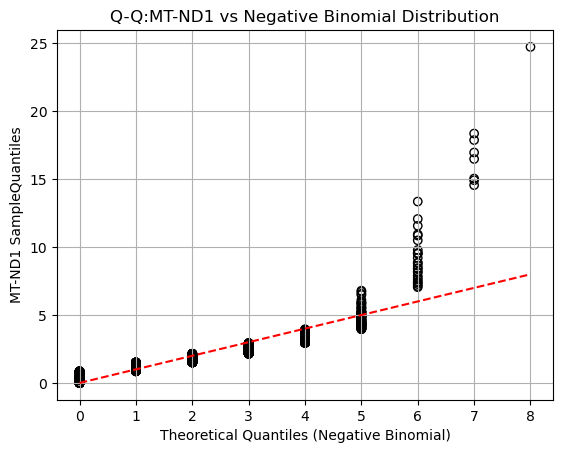

<Figure size 800x800 with 0 Axes>

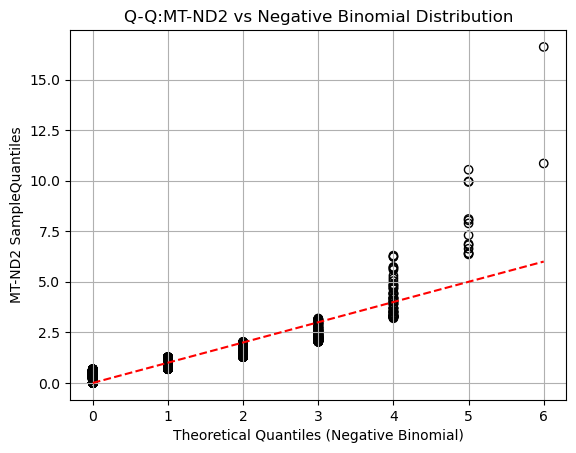

<Figure size 800x800 with 0 Axes>

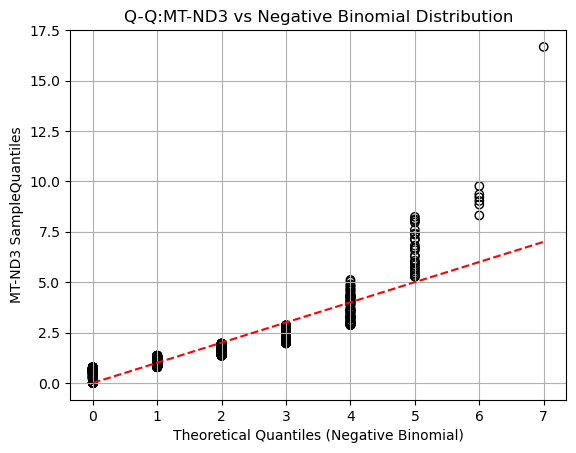

<Figure size 800x800 with 0 Axes>

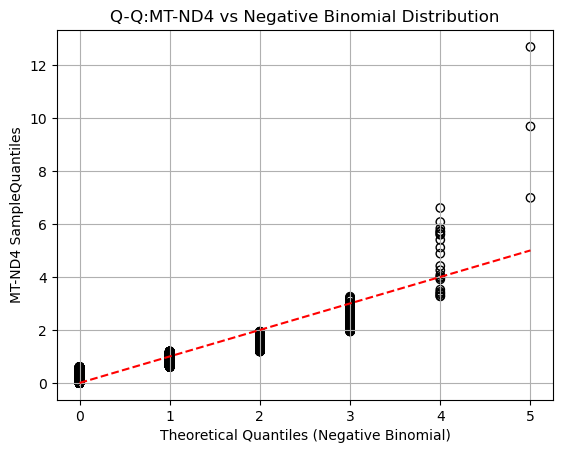

<Figure size 800x800 with 0 Axes>

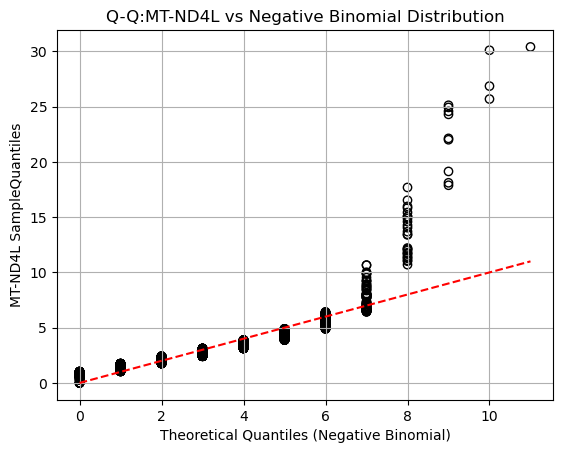

<Figure size 800x800 with 0 Axes>

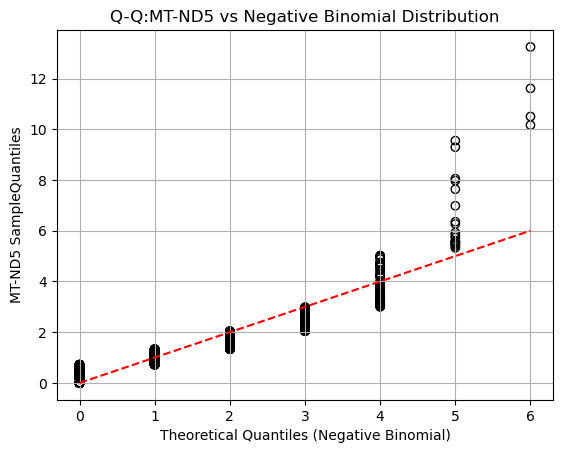

<Figure size 800x800 with 0 Axes>

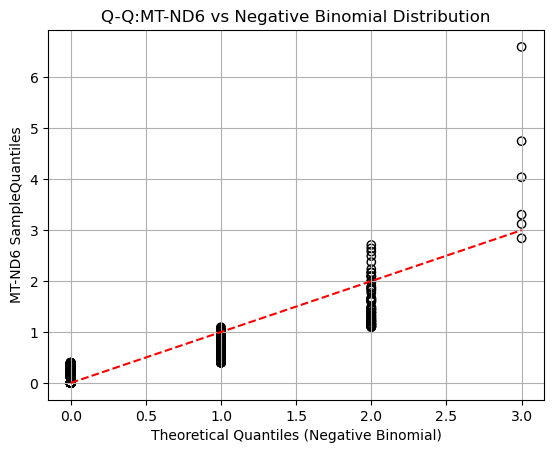

<Figure size 800x800 with 0 Axes>

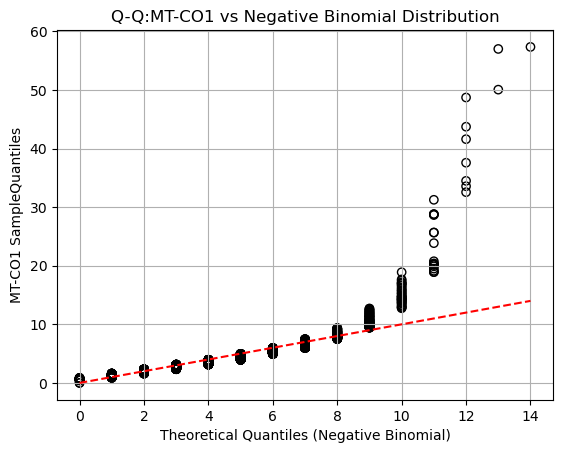

<Figure size 800x800 with 0 Axes>

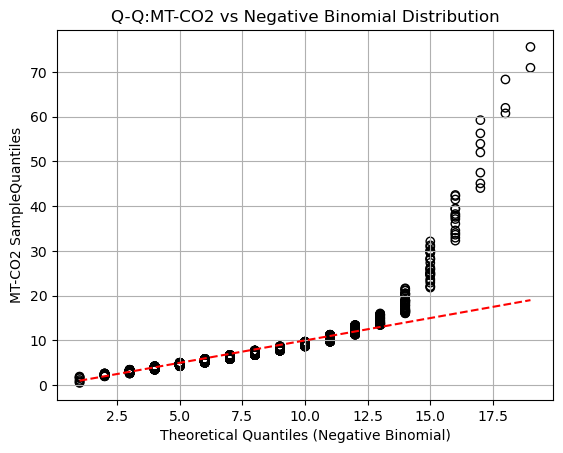

<Figure size 800x800 with 0 Axes>

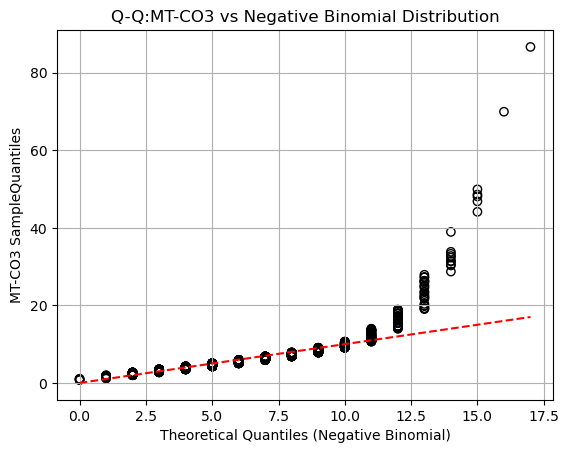

<Figure size 800x800 with 0 Axes>

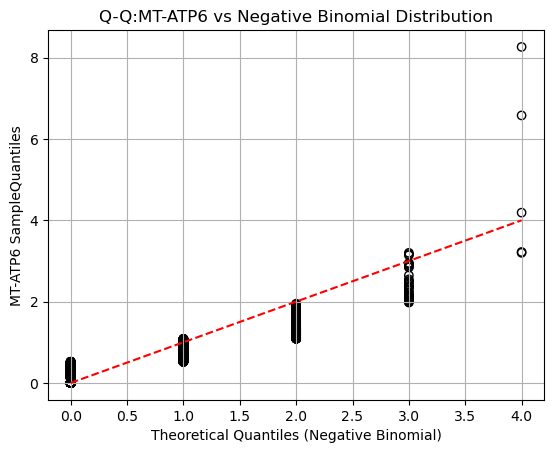

<Figure size 800x800 with 0 Axes>

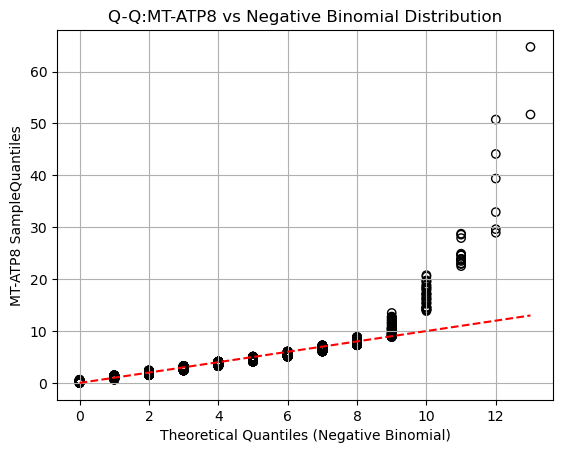

<Figure size 800x800 with 0 Axes>

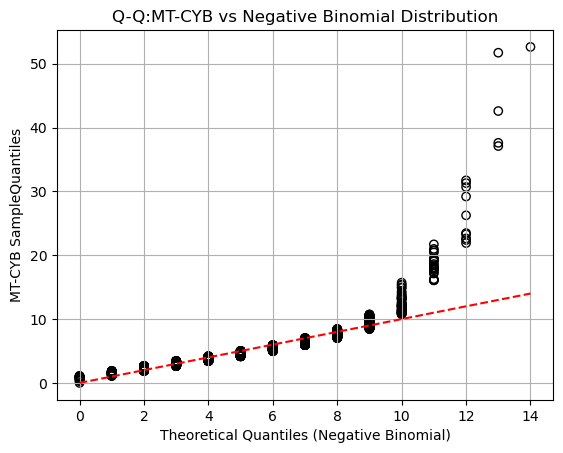

<Figure size 800x800 with 0 Axes>

In [41]:
qq_nbi(p14_intnon_n3,intpro,1000,mle14_list_n3)


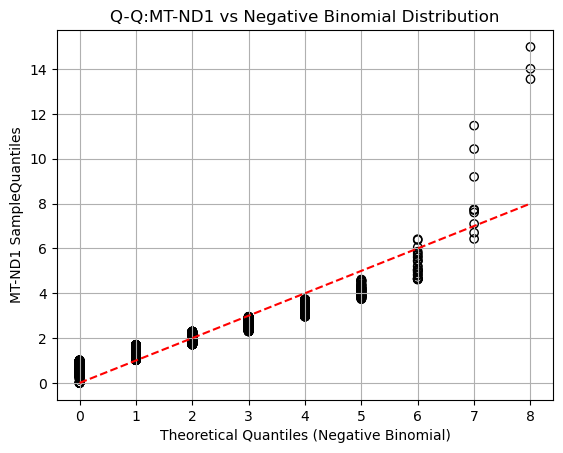

<Figure size 800x800 with 0 Axes>

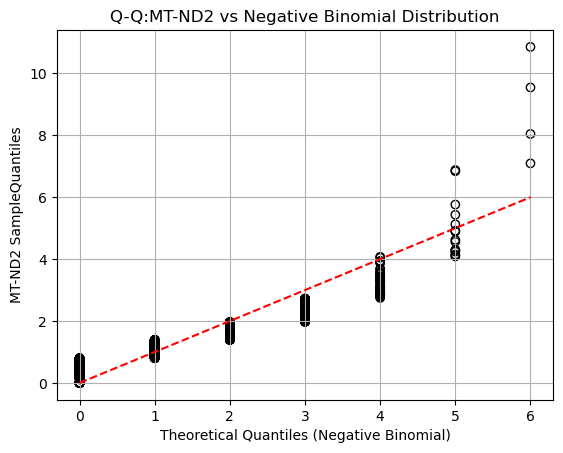

<Figure size 800x800 with 0 Axes>

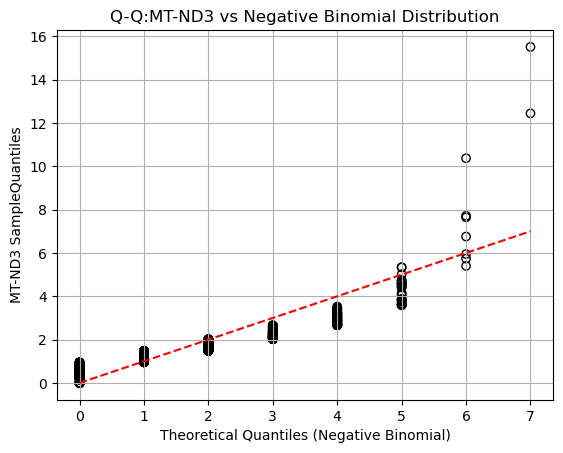

<Figure size 800x800 with 0 Axes>

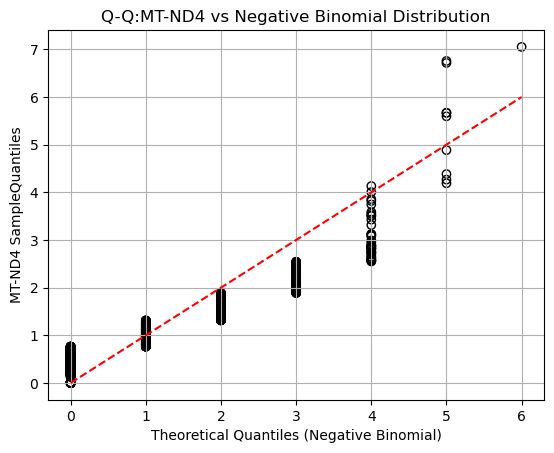

<Figure size 800x800 with 0 Axes>

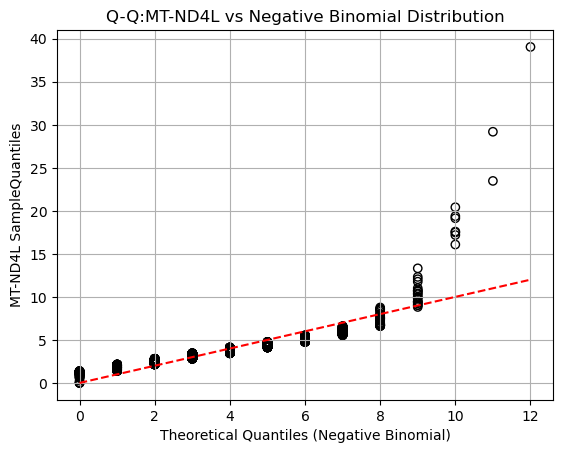

<Figure size 800x800 with 0 Axes>

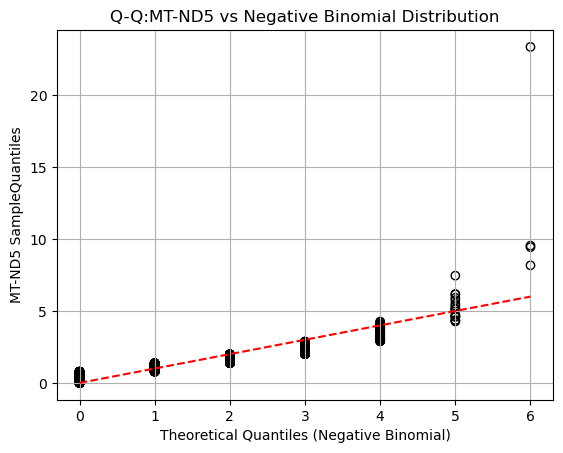

<Figure size 800x800 with 0 Axes>

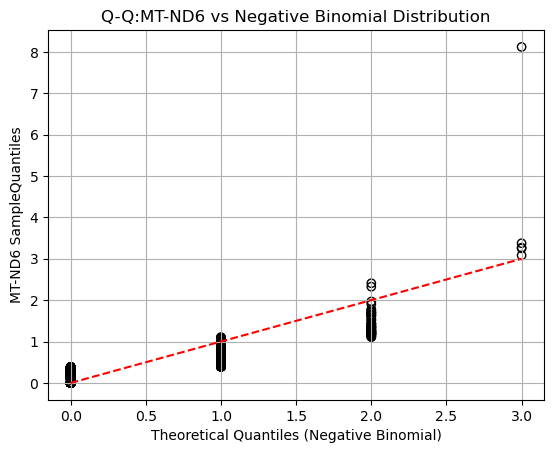

<Figure size 800x800 with 0 Axes>

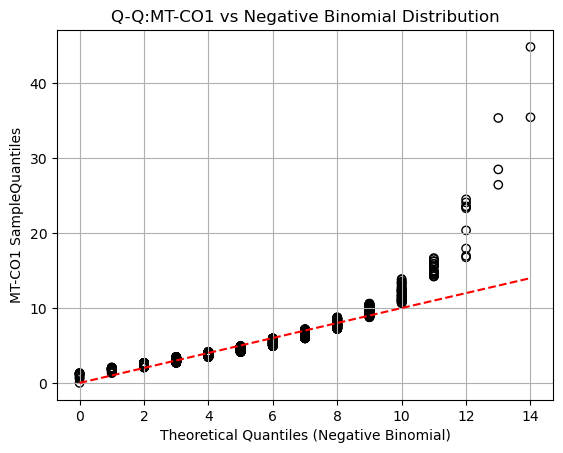

<Figure size 800x800 with 0 Axes>

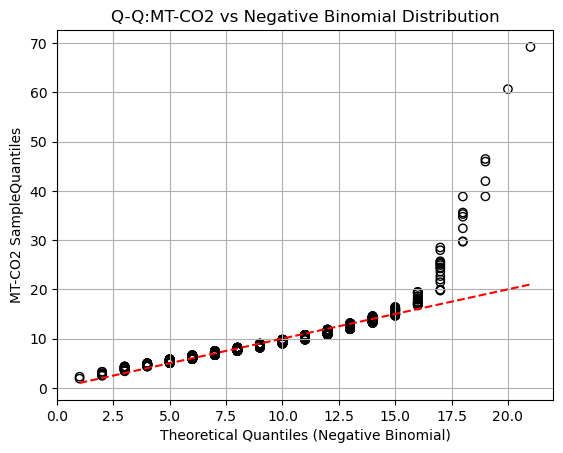

<Figure size 800x800 with 0 Axes>

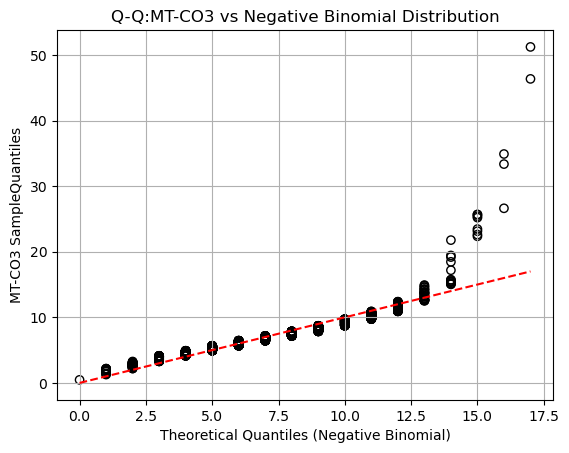

<Figure size 800x800 with 0 Axes>

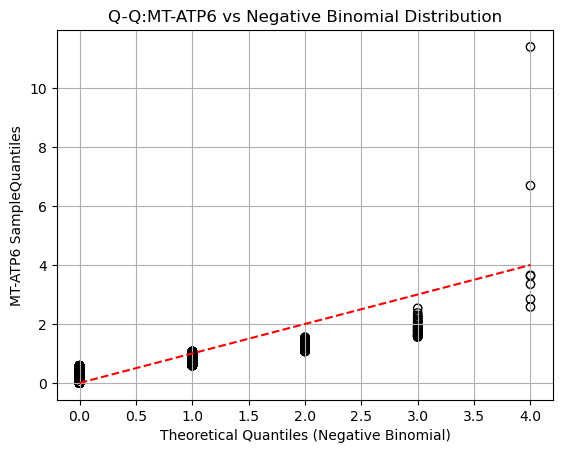

<Figure size 800x800 with 0 Axes>

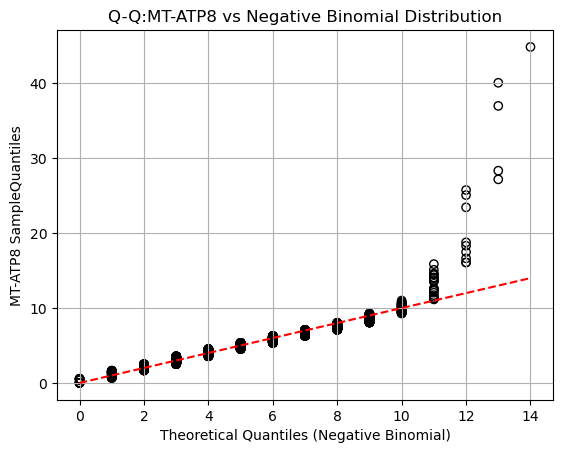

<Figure size 800x800 with 0 Axes>

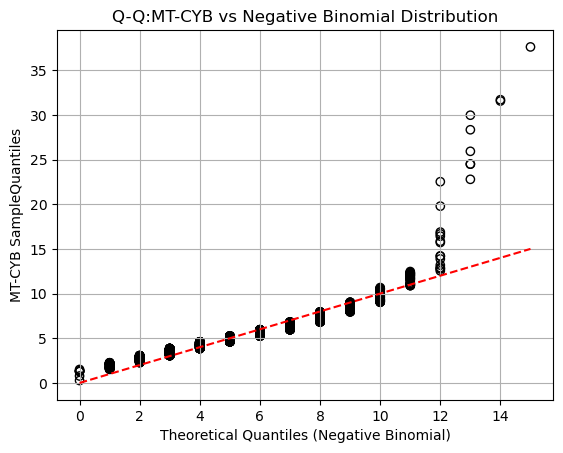

<Figure size 800x800 with 0 Axes>

In [44]:
qq_nbi(p18_intnon_n3,intpro,1000,mle18_list_n3)


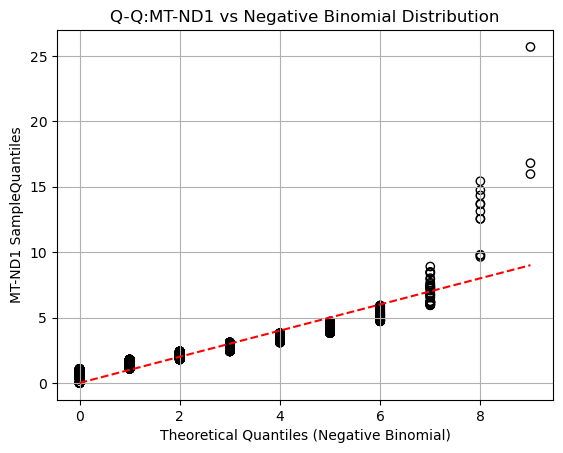

<Figure size 800x800 with 0 Axes>

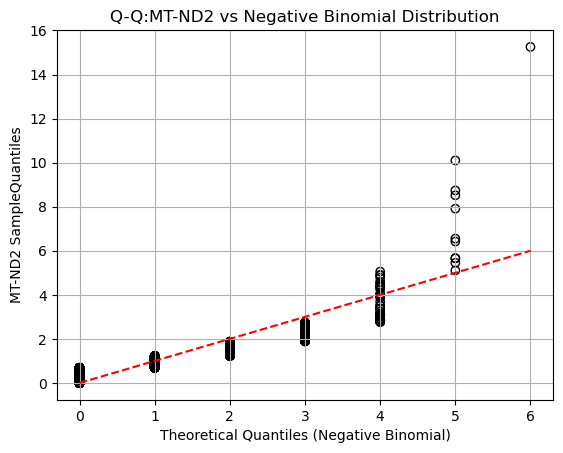

<Figure size 800x800 with 0 Axes>

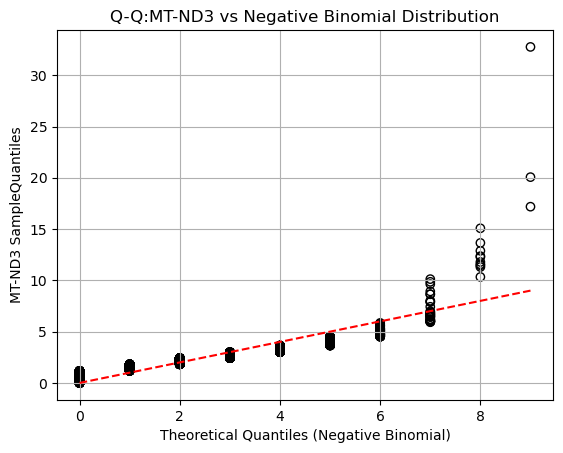

<Figure size 800x800 with 0 Axes>

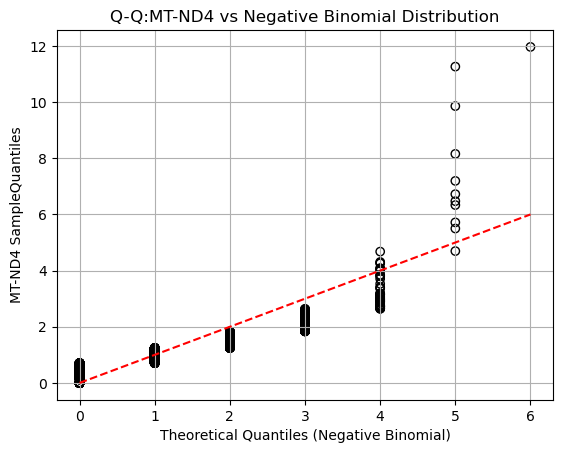

<Figure size 800x800 with 0 Axes>

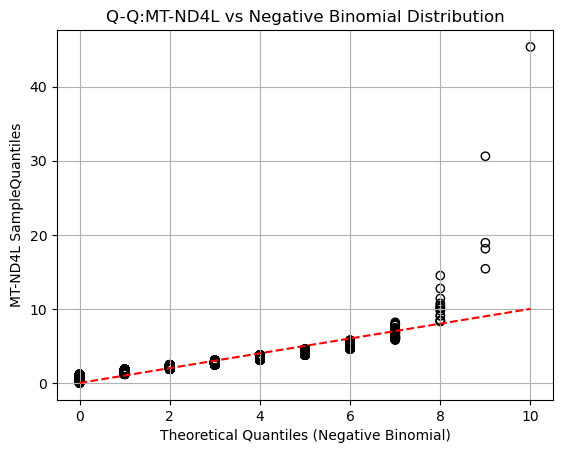

<Figure size 800x800 with 0 Axes>

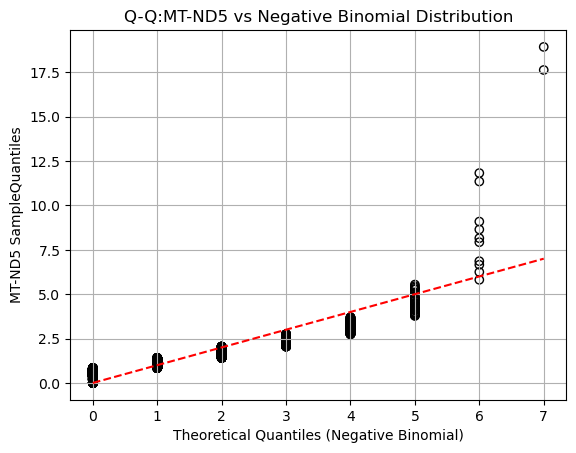

<Figure size 800x800 with 0 Axes>

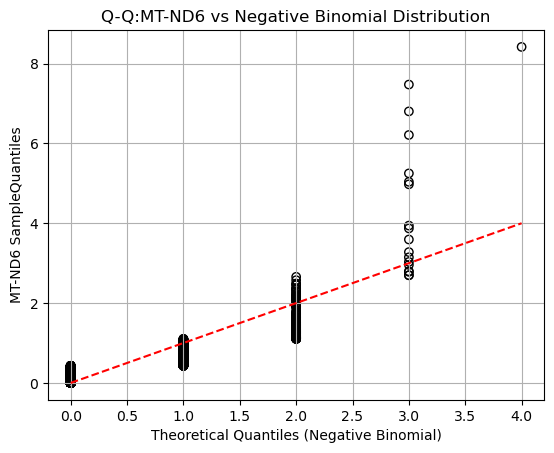

<Figure size 800x800 with 0 Axes>

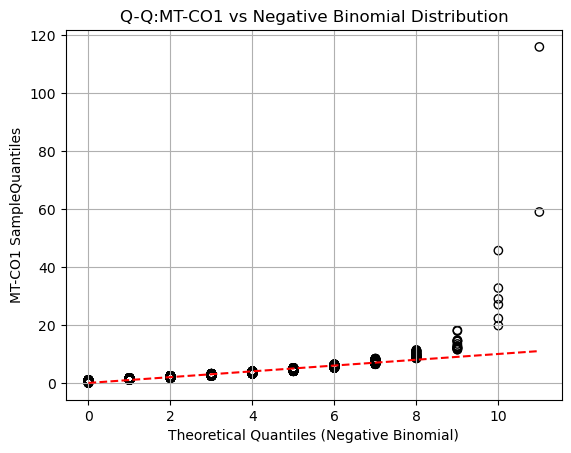

<Figure size 800x800 with 0 Axes>

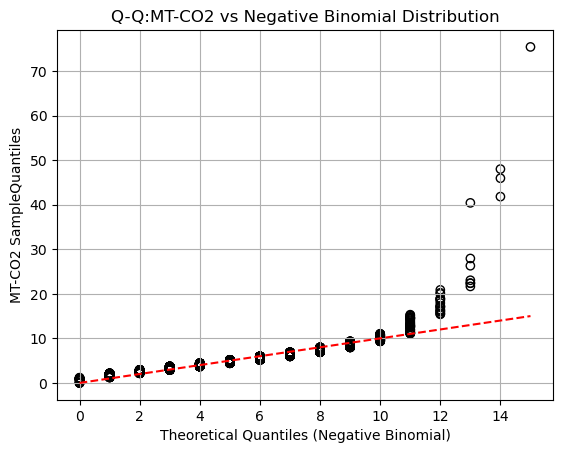

<Figure size 800x800 with 0 Axes>

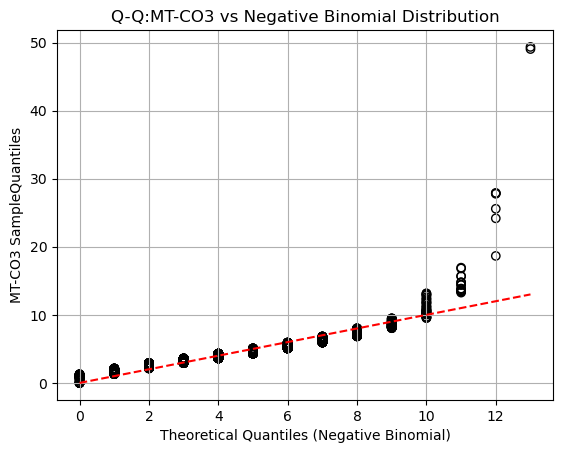

<Figure size 800x800 with 0 Axes>

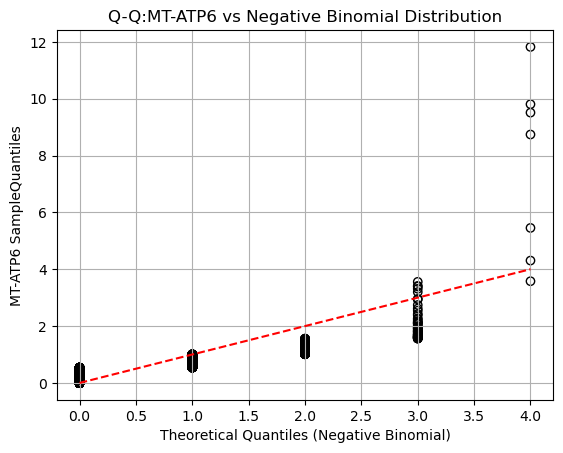

<Figure size 800x800 with 0 Axes>

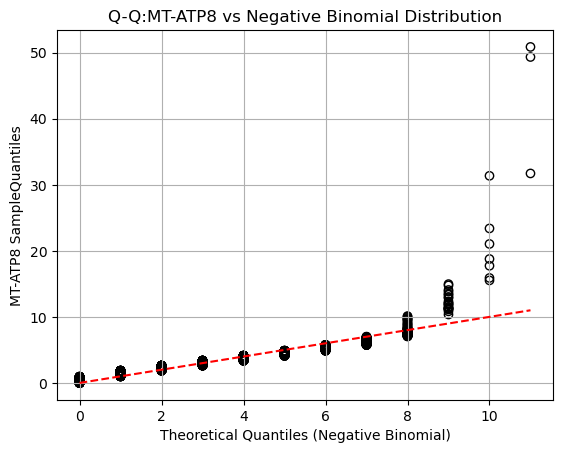

<Figure size 800x800 with 0 Axes>

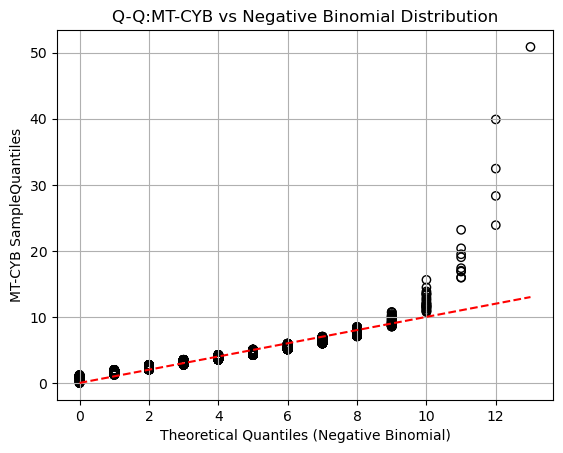

<Figure size 800x800 with 0 Axes>

In [45]:
qq_nbi(p24_intnon_n3,intpro,1000,mle24_list_n3)


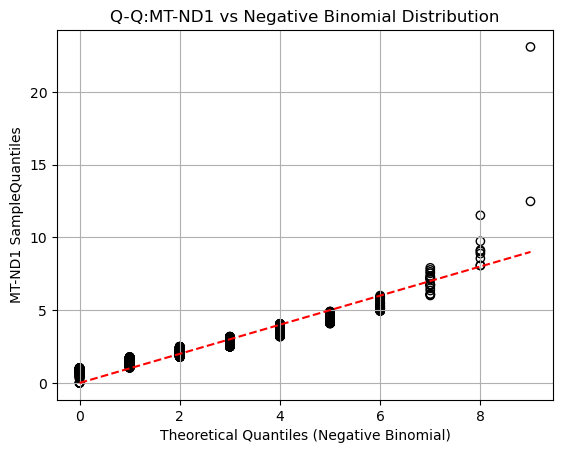

<Figure size 800x800 with 0 Axes>

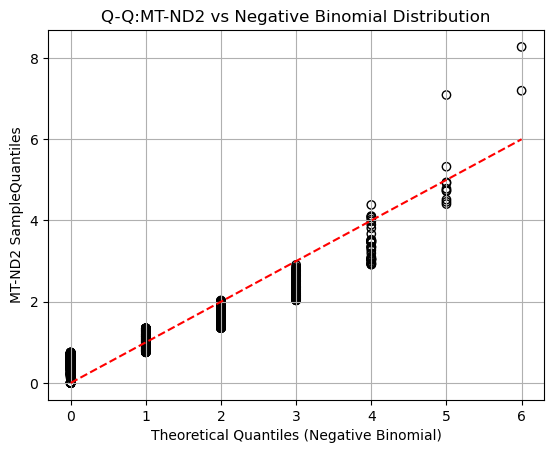

<Figure size 800x800 with 0 Axes>

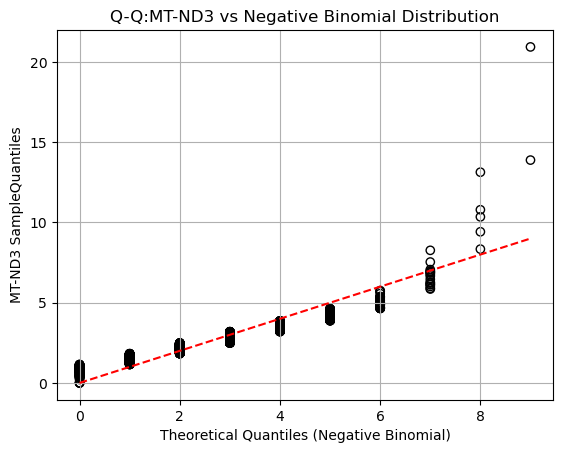

<Figure size 800x800 with 0 Axes>

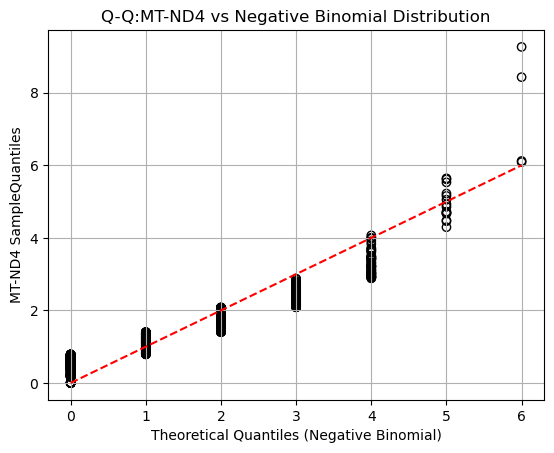

<Figure size 800x800 with 0 Axes>

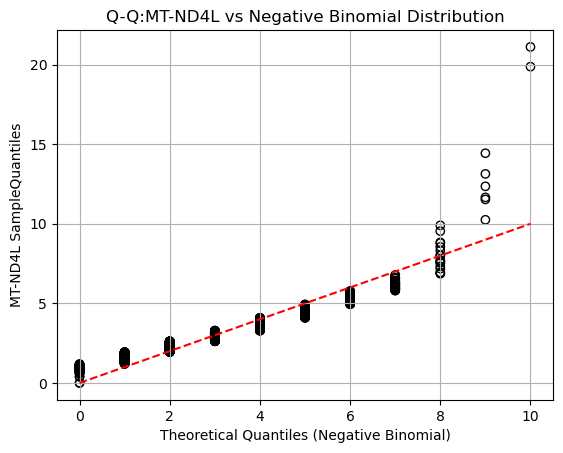

<Figure size 800x800 with 0 Axes>

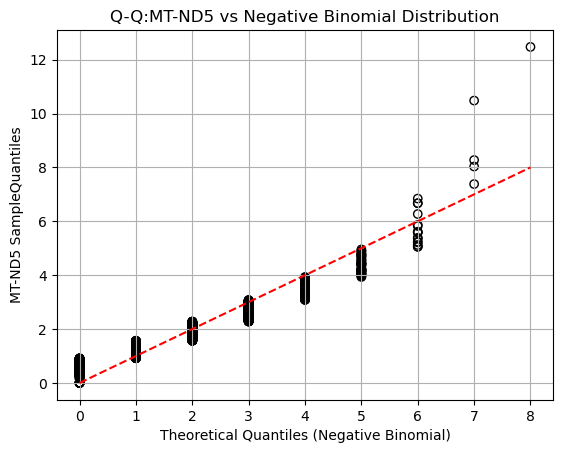

<Figure size 800x800 with 0 Axes>

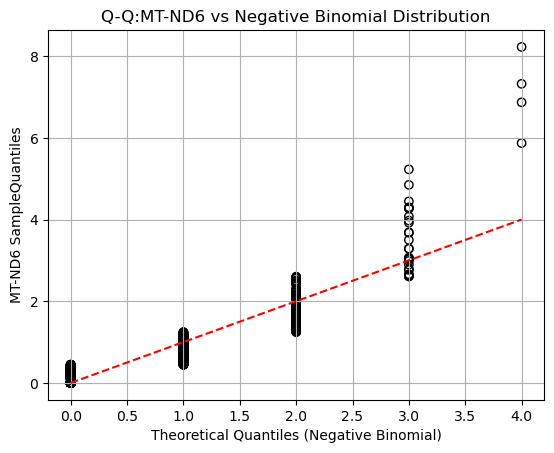

<Figure size 800x800 with 0 Axes>

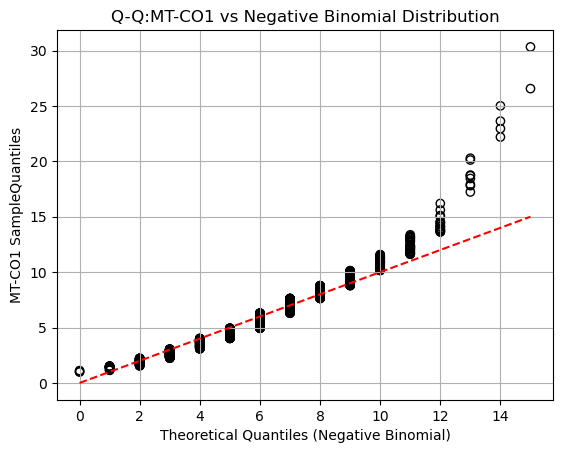

<Figure size 800x800 with 0 Axes>

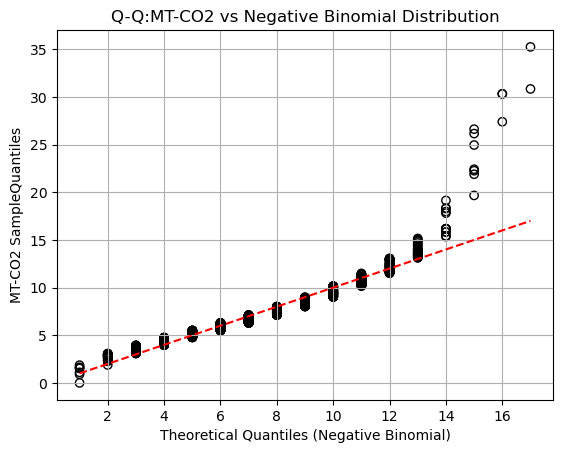

<Figure size 800x800 with 0 Axes>

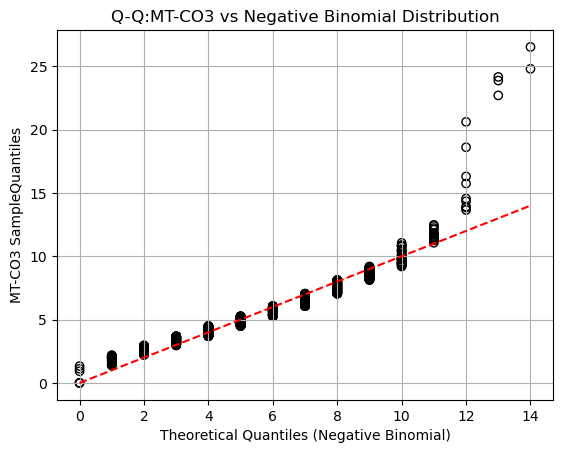

<Figure size 800x800 with 0 Axes>

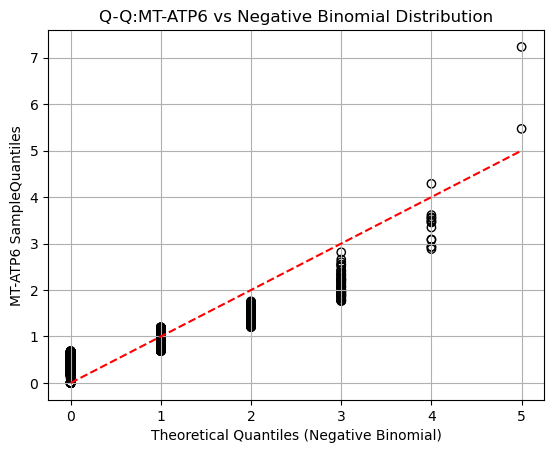

<Figure size 800x800 with 0 Axes>

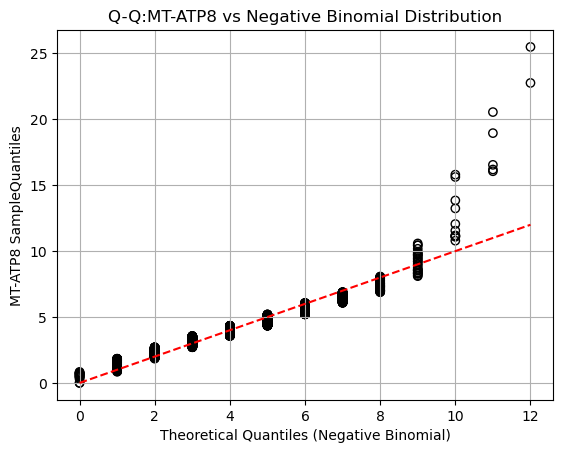

<Figure size 800x800 with 0 Axes>

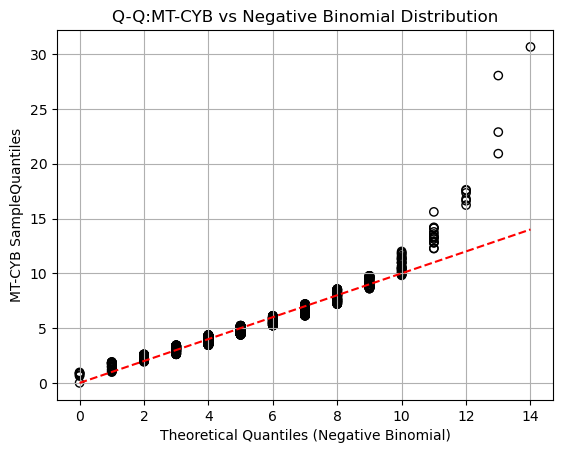

<Figure size 800x800 with 0 Axes>

In [46]:
qq_nbi(p28_intnon_n3,intpro,1000,mle28_list_n3)


In [48]:
def ppc_poi_gam(df,index_list):
    import arviz as az
    for i in index_list:
        poi_gam_model=pm.Model()
        with poi_gam_model:
            p_prior=pm.Uniform('p'+i,lower=0,upper=1) #prior
            obs=pm.NegativeBinomial('obs', mu=1000*(1-p_prior)/p_prior, alpha=1000, observed=df[i]) #likelihood
            trace=pm.sample(1000,return_inferencedata=True)
            az.plot_trace(trace)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p]


c:\Users\lizar\anaconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.


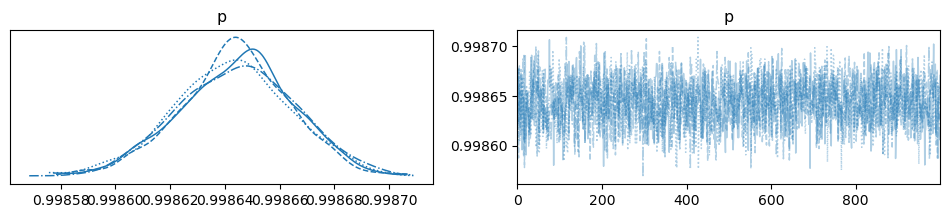

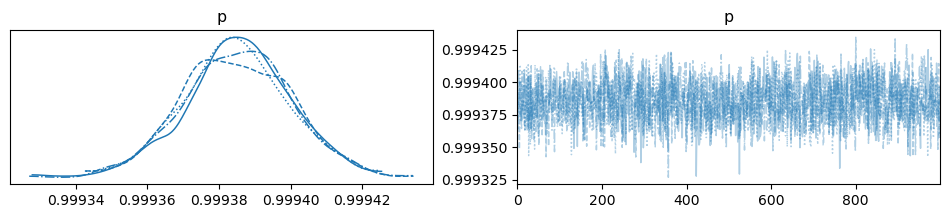

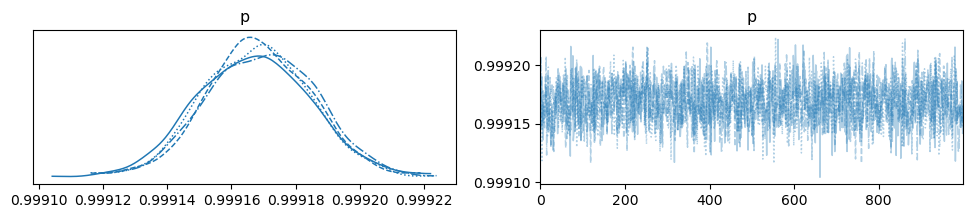

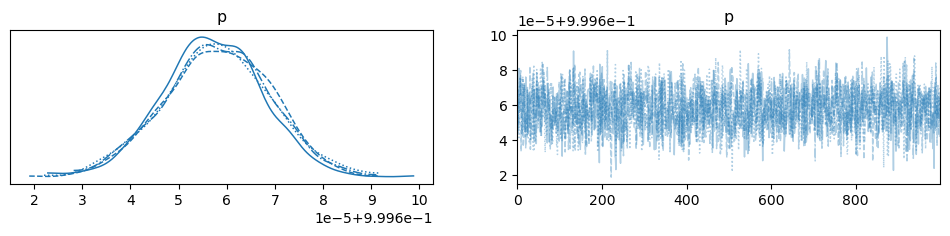

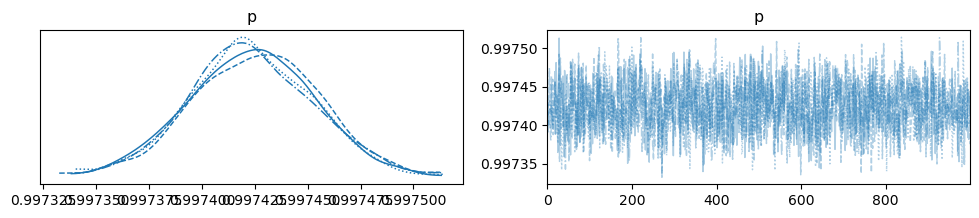

...

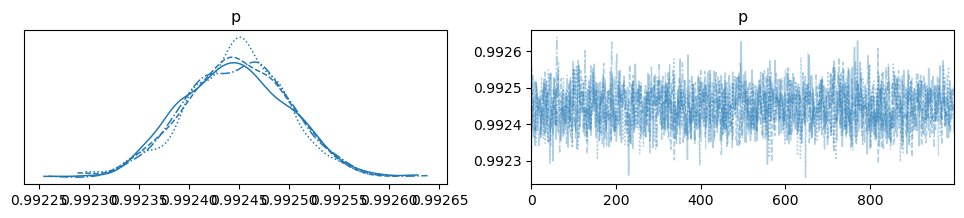

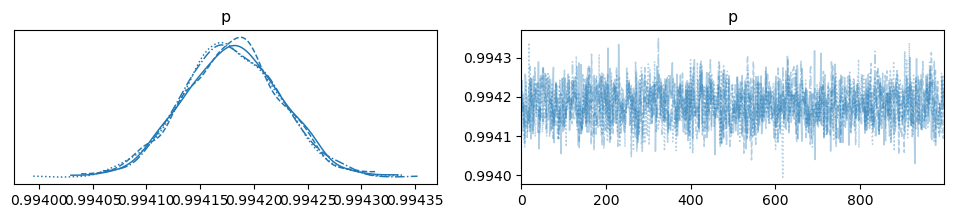

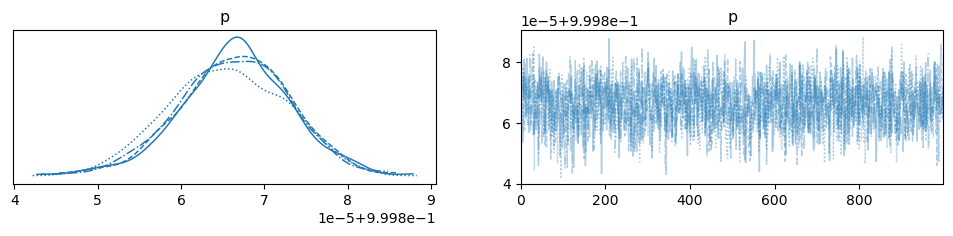

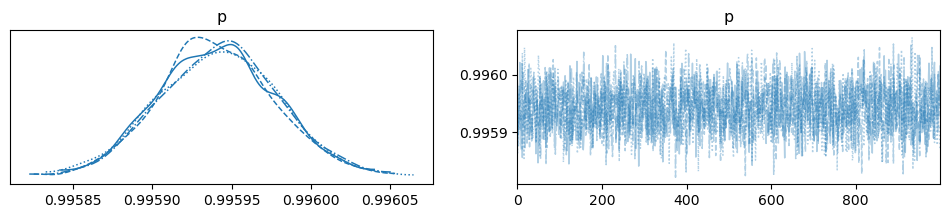

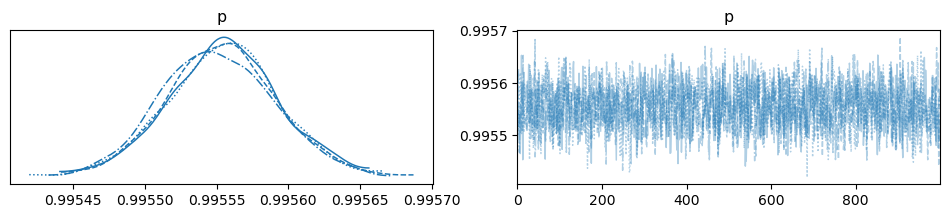

In [49]:
ppc_poi_gam(p14_intnon_n3,intpro)